# Projeto - FCD: Análise dos Acidentes de Trânsito de Belo Horizonte
>**Aluno:** Luís Henrique Emediato de Rezende Lara  
> **RA:** XXXXXXXXXX

#### Importações necessárias

In [3]:
import babypandas as bpd
import glob
import pandas as pd
import numpy as np
# para a visualização de dados:
import matplotlib.pyplot as plt
plt.style.use('ggplot')

### Base de Dados


In [5]:
df = bpd.DataFrame()
for f in glob.glob('*.csv'):
    aux = bpd.read_csv(f, sep=';')
    df = df.append(aux)
data_correta = pd.to_datetime(
    df.get('data hora_boletim').values
)
df = df.assign(
    data_boletim = data_correta
)
df = df.drop(
    columns=['data hora_boletim',
             'data_inclusao',
             'valor_ups',
             'valor_ups_antiga',
             'data_alteracao_smsa',
             'descricao_ups_antiga']
).sort_values(by='data_boletim').set_index('data_boletim')

In [6]:
df

,numero_boletim,tipo_acidente,desc_tipo_acidente,cod_tempo,desc_tempo,cod_pavimento,pavimento,cod_regional,desc_regional,origem_boletim,...,coordenada_x,coordenada_y,hora_informada,indicador_fatalidade,descricao_ups,ano,mes,lat,lon,bairro
data_boletim,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:30:00,2016-008685542-001,H04000,QUEDA DE PESSOA DE VEICULO ...,0,NAO INFORMADO,0,NAO INFORMADO,21,NORDESTE,POLICIA CIVIL,...,610820.43,7801707.67,SIM,NÃO,NÃO INFORMADO,2016,1,-43.941446,-19.877669,Parque São João Batista
2016-01-01 01:00:00,2016-001865528-001,H06002,ATROPELAMENTO DE PESSOA SEM VITIMA FATAL ...,0,NAO INFORMADO,0,NAO INFORMADO,20,LESTE,POLICIA CIVIL,...,616043.53,7799563.76,SIM,NÃO,NÃO INFORMADO,2016,1,-43.891427,-19.896736,Casa Branca
2016-01-01 01:30:00,2016-014489036-001,H01002,ABALROAMENTO COM VITIMA ...,0,NAO INFORMADO,0,NAO INFORMADO,23,NORTE,POLICIA CIVIL,...,610686.91,7805465.91,SIM,NÃO,NÃO INFORMADO,2016,1,-43.942946,-19.843720,Padre Júlio Maria
2016-01-01 02:55:00,2016-000009920-001,H01002,ABALROAMENTO COM VITIMA ...,0,NAO INFORMADO,0,NAO INFORMADO,23,NORTE,POLICIA MILITAR,...,610958.28,7806566.34,SIM,NÃO,NÃO INFORMADO,2016,1,-43.940421,-19.833761,Santa Isabel
2016-01-01 03:00:00,2016-000207284-001,H09002,COLISAO DE VEICULOS COM VITIMA ...,1,BOM,1,ASFALTO,19,CENTRO-SUL,POLICIA CIVIL,...,611496.74,7793765.15,SIM,NÃO,NÃO INFORMADO,2016,1,-43.934506,-19.949393,Sion
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 18:08:00,2022-057273258-001,H01002,ABALROAMENTO COM VITIMA ...,1,BOM,1,ASFALTO,23,NORTE,POLICIA MILITAR,...,612239.23,7810127.89,SIM,NÃO,NÃO INFORMADO,2022,12,-43.928406,-19.801509,Conjunto Zilah Spósito
2022-12-31 20:16:00,2022-057287120-001,H09002,COLISAO DE VEICULOS COM VITIMA ...,0,NAO INFORMADO,0,NAO INFORMADO,19,CENTRO-SUL,POLICIA MILITAR,...,612986.62,7795656.61,SIM,NÃO,NÃO INFORMADO,2022,12,-43.920387,-19.932217,São Lucas
2022-12-31 20:29:00,2022-057285174-001,H09002,COLISAO DE VEICULOS COM VITIMA ...,0,NAO INFORMADO,0,NAO INFORMADO,20,LESTE,POLICIA MILITAR,...,615392.56,7798300.78,SIM,NÃO,NÃO INFORMADO,2022,12,-43.897566,-19.908186,Belém


## Problemas

### 1. Faça um gráfico de linhas por ano mês indicando o número de acidentes naquele ano mês.

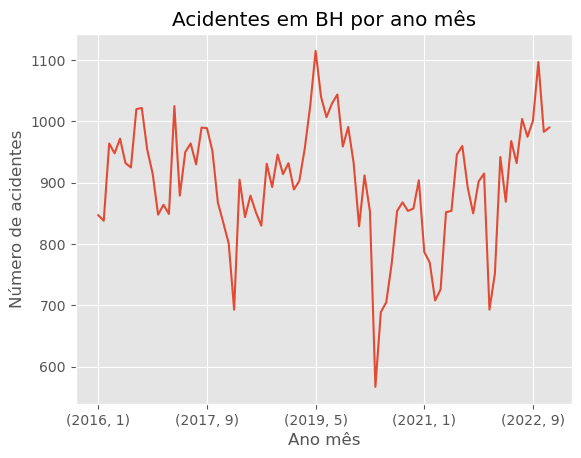

In [9]:
#Agrupamento dos acidentes por ano mês
acidentes_por_ano_mes = df.groupby(['ano', 'mes']).size()
#Criando o gráfico de linha
acidentes_por_ano_mes.plot(kind = 'line',
                           xlabel = 'Ano mês',
                           ylabel = 'Número de acidentes',
                           title = 'Acidentes em BH por ano mês')
plt.show()

### 2. Repita o gráfico acima por ano apenas.


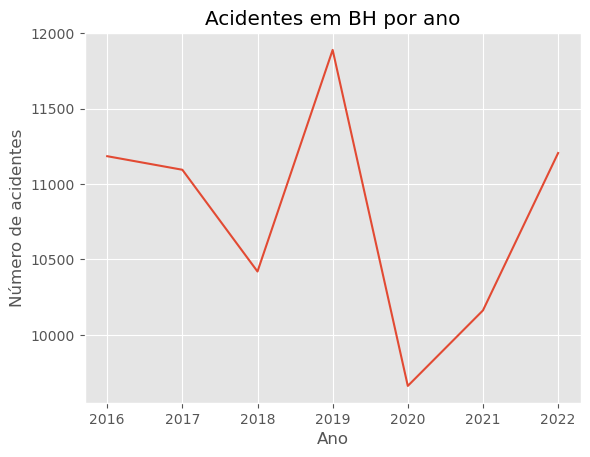

In [11]:
#Agrupamento dos acidentes por ano
acidentes_por_ano = df.groupby(['ano']).size()
#Criando o gráfico de linha
acidentes_por_ano.plot(kind='line',
                       xlabel = 'Ano',
                       ylabel = 'Número de acidentes',
                       title = 'Acidentes em BH por ano')
plt.show()

### 3. Faça um gráfico de barras por ano indicando os tipos de acidentes mais comuns no ano.


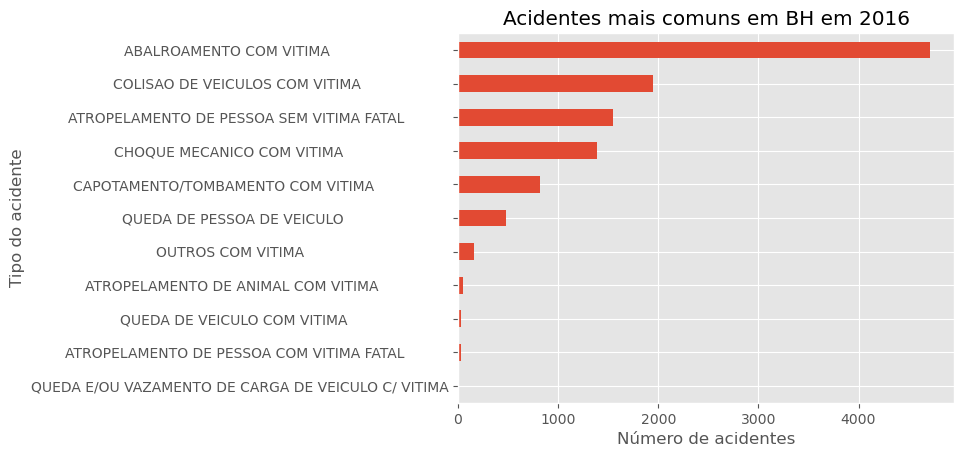

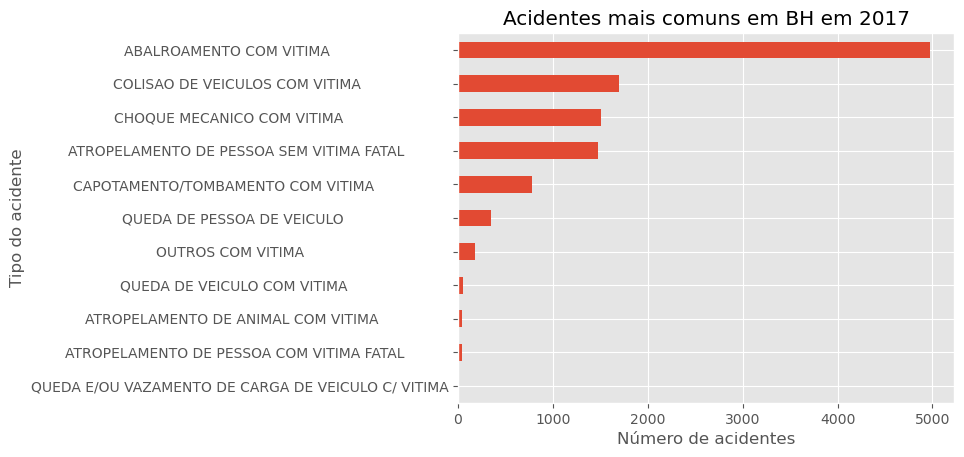

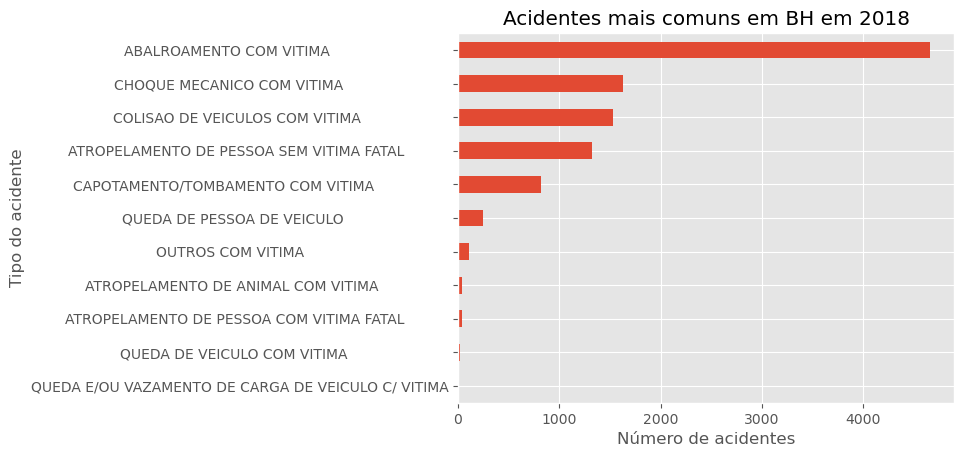

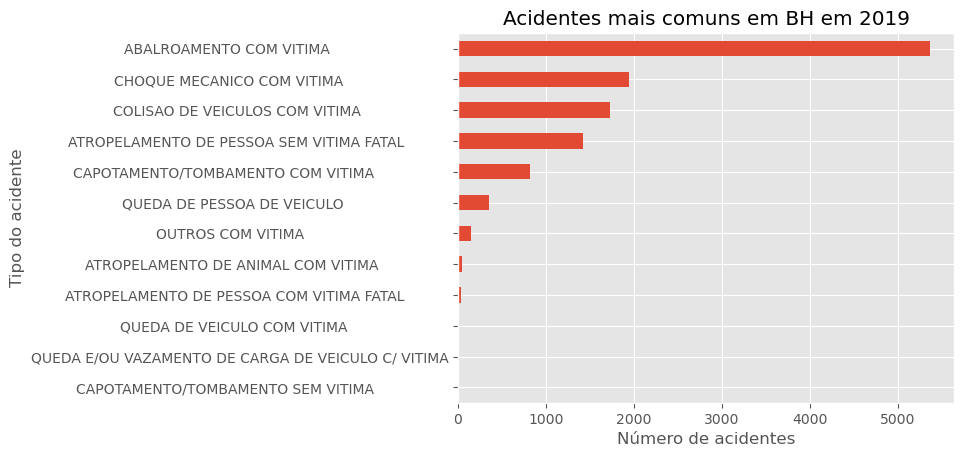

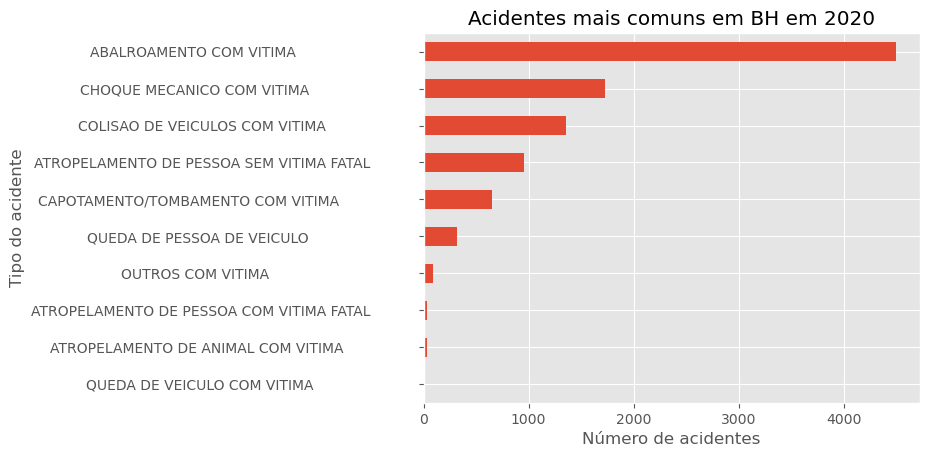

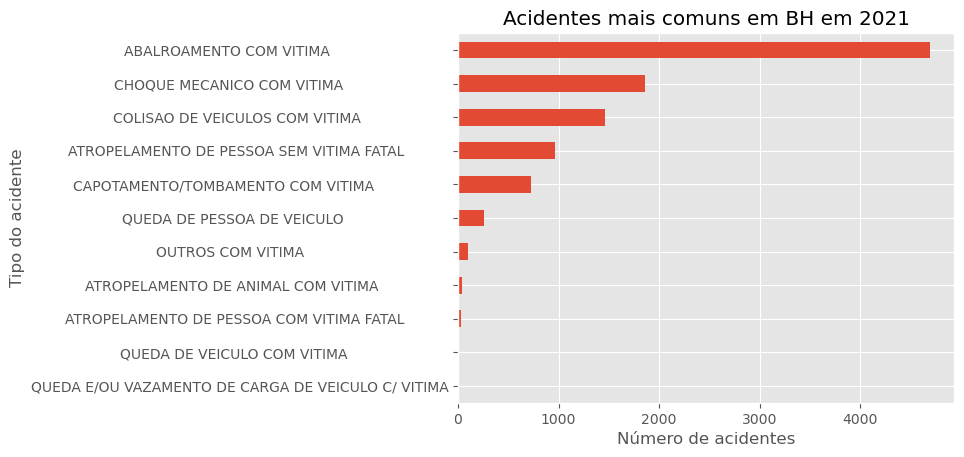

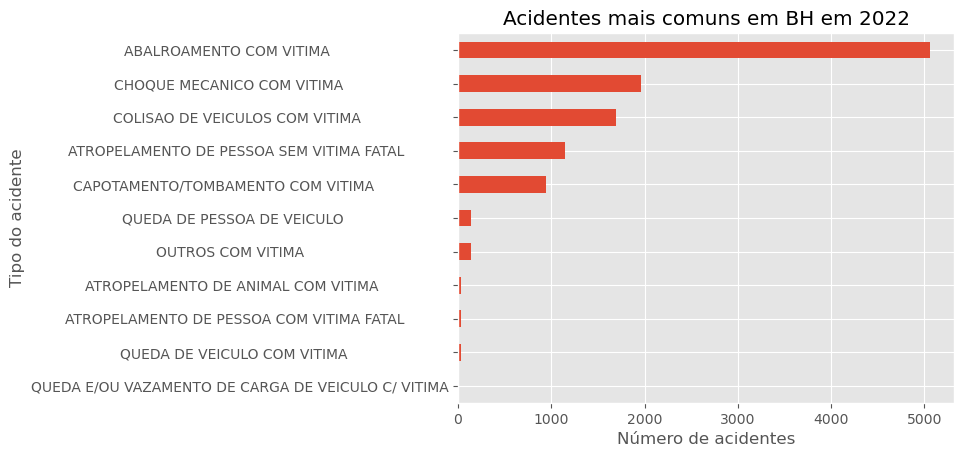

In [13]:
#loop para contar a quantidade de cada tipo de acidente por ano, deixar em ordem decrescente de quantidade de ocorrência e criar o gráfico de barras por ano
for ano in range(2016, 2022+1):
    df_ano = df[df.get('ano') == ano]
    acidentes_do_ano_por_tipo = df_ano.groupby(['desc_tipo_acidente']).size().sort_values()
    acidentes_do_ano_por_tipo.plot(kind = 'barh',
                                   xlabel = 'Número de acidentes',
                                   ylabel = 'Tipo do acidente',
                                   title = f'Acidentes mais comuns em BH em {ano}')
    plt.show()

### 4. Repita o gráfico acima considerando gráficos fatais e não fatais.

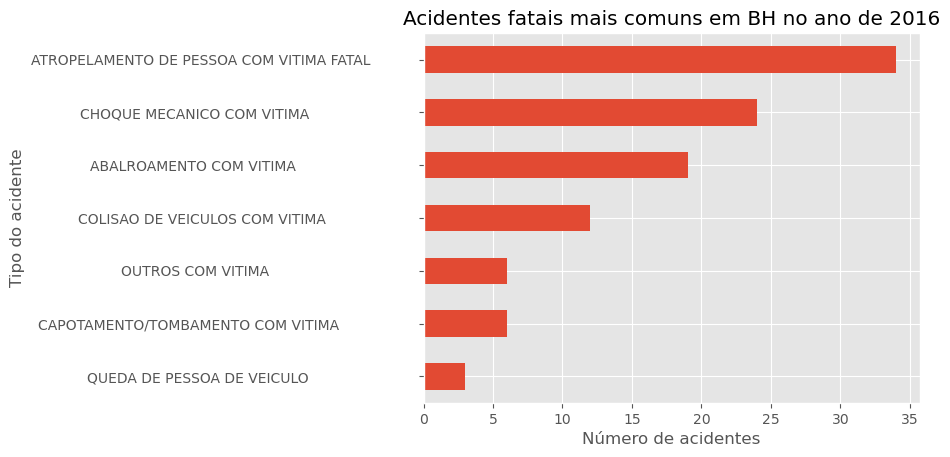

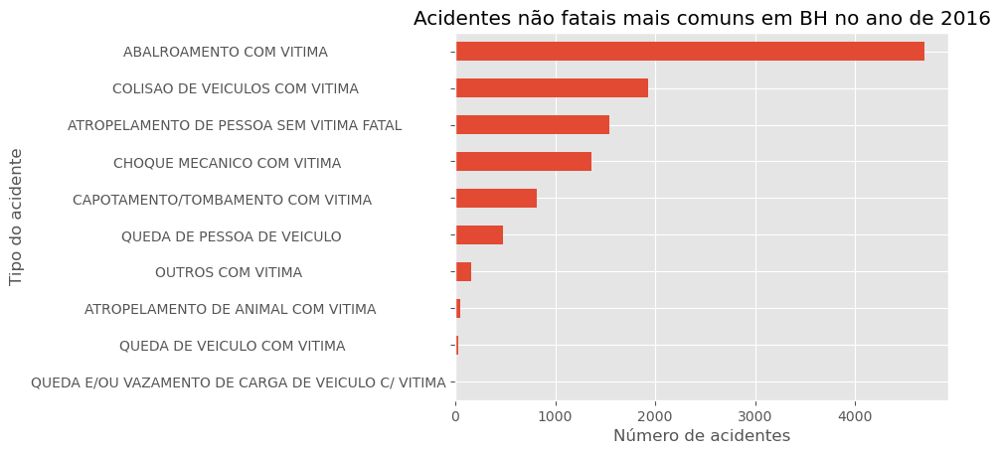

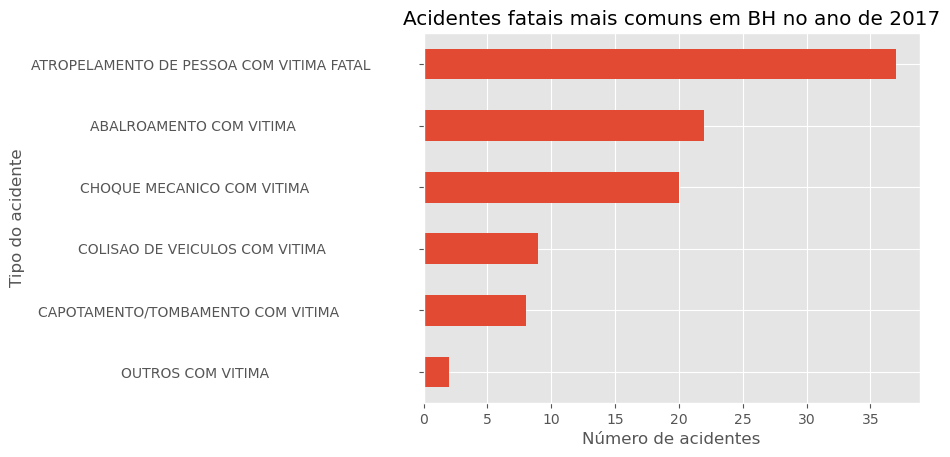

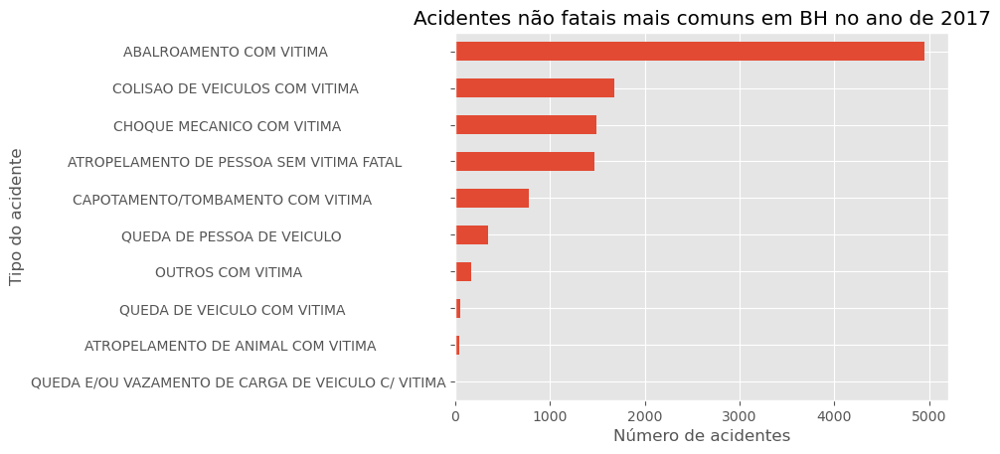

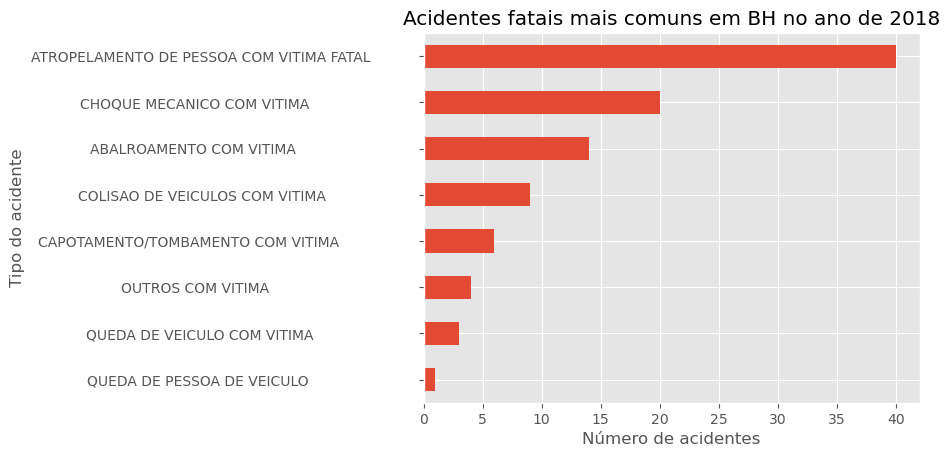

...

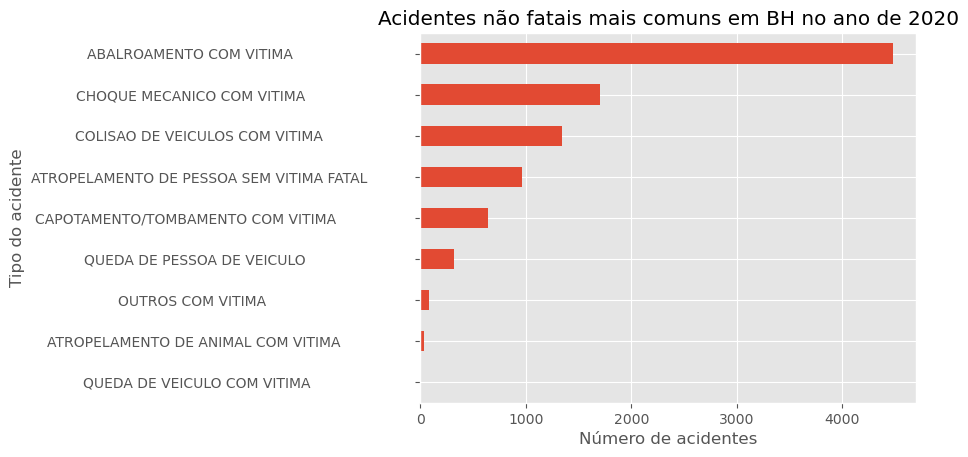

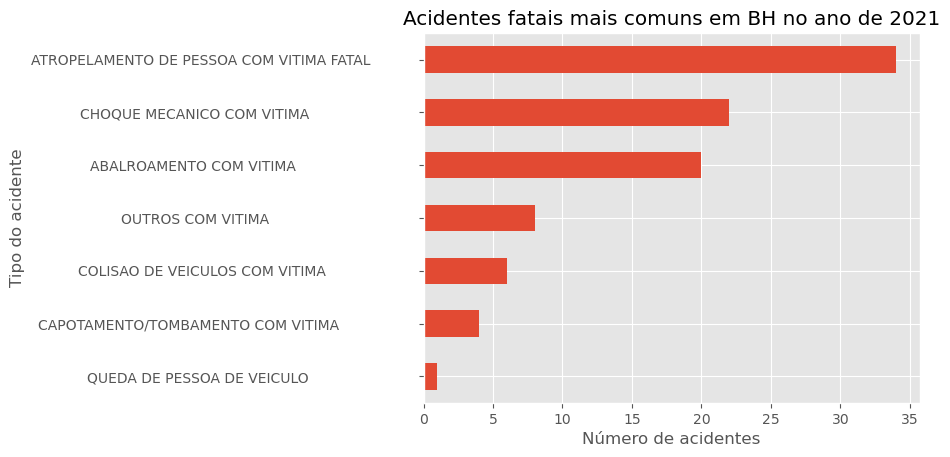

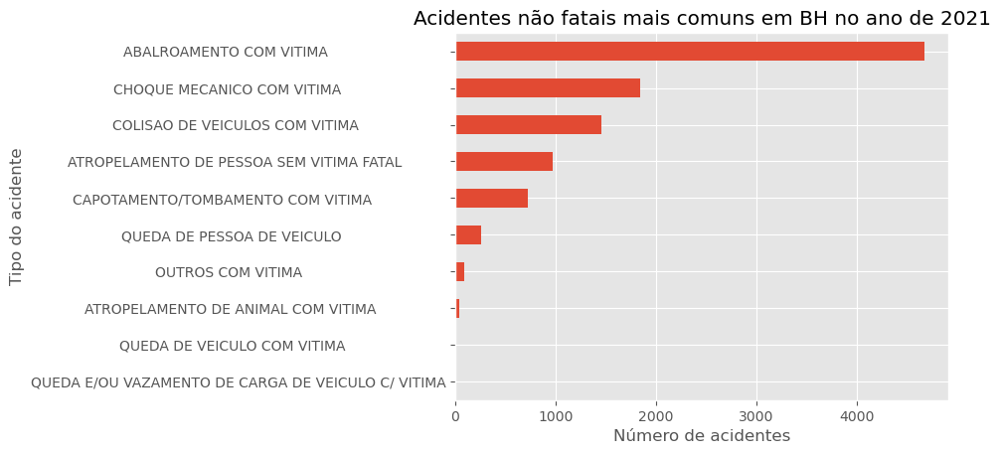

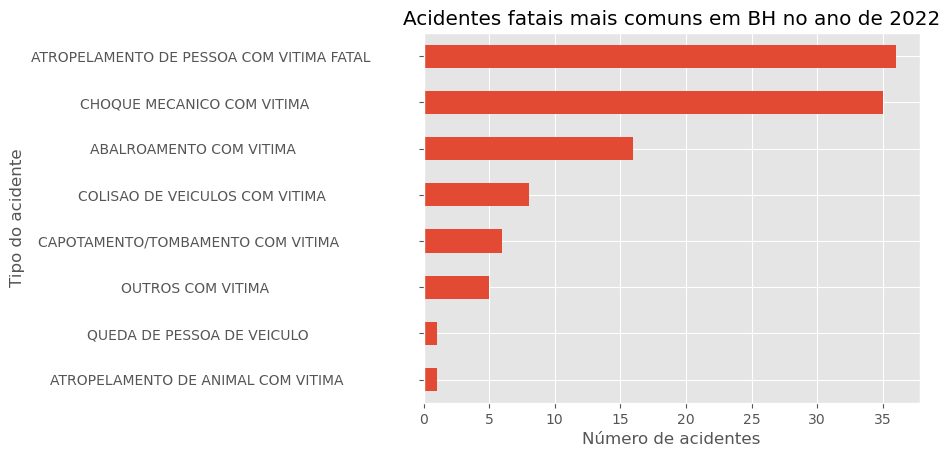

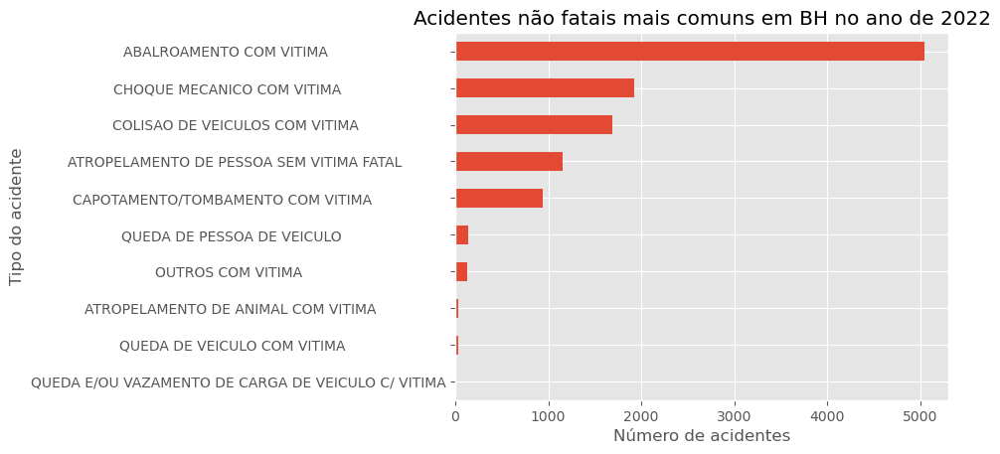

In [15]:
#loop para achar a quantidade de cada tipo de acidente fatais e não fatais por ano, deixar em ordem decrescente de quantidade de ocorrência e criar o gráfico de barras
for ano in range(2016, 2022+1):
    df_ano = df.loc[df.get('ano') == ano]

    #casos fatais
    df_acidentes_do_ano_fatais = df_ano.loc[df_ano.get('indicador_fatalidade') == "SIM"]
    df_acidentes_do_ano_fatais_por_tipo = df_acidentes_do_ano_fatais.groupby('desc_tipo_acidente').size().sort_values()
    df_acidentes_do_ano_fatais_por_tipo.plot(kind = 'barh',
                                             xlabel = 'Número de acidentes',
                                             ylabel = 'Tipo do acidente',
                                             title = f"Acidentes fatais mais comuns em BH no ano de {ano}")
    plt.show()                                      
    #casos não fatais
    df_acidentes_do_ano_nao_fatais = df_ano.loc[df_ano.get('indicador_fatalidade')== "NÃO"]
    df_acidentes_do_ano_nao_fatais_por_tipo = df_acidentes_do_ano_nao_fatais.groupby('desc_tipo_acidente').size().sort_values()
    df_acidentes_do_ano_nao_fatais_por_tipo.plot(kind = 'barh',
                                                 xlabel = 'Número de acidentes',
                                                 ylabel = 'Tipo do acidente',
                                                 title = f"Acidentes não fatais mais comuns em BH no ano de {ano}")
    plt.show()

> Uma outra interpretação interessante seria a análise da quantidade de acidentes fatais e não fatais por ano:

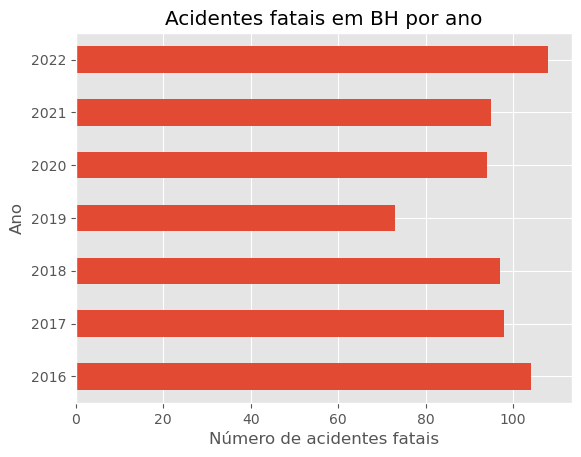

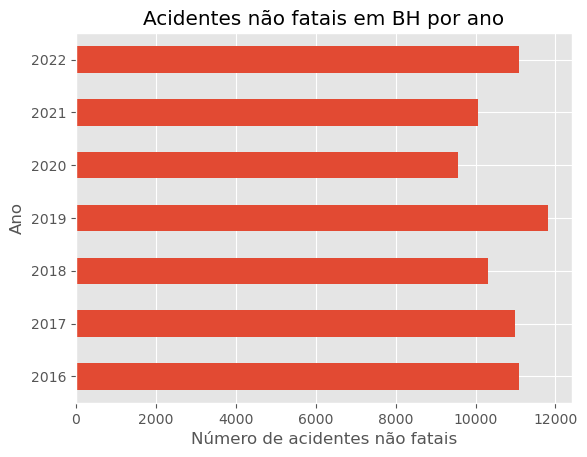


Para facilitar a comparação entre acidentes fatais e não fatais, combinei os dois gráficos anteriores em um único.



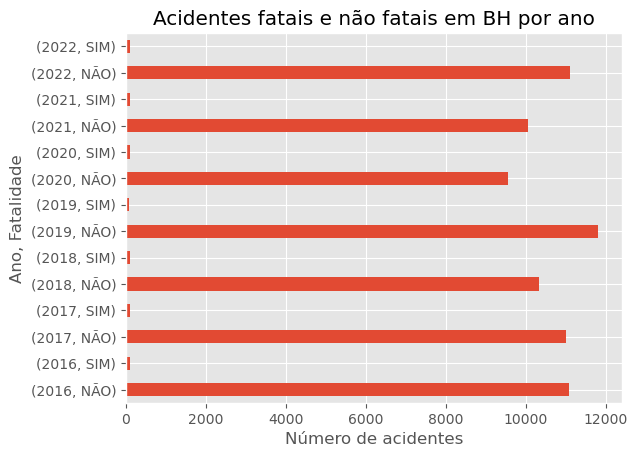

In [17]:
#contar a quantidade de acidentes fatais, agrupar por ano e criar o gráfico
df_fatal = df[df.get('indicador_fatalidade') == "SIM"]
acidentes_fatais_por_ano = df_fatal.groupby(['ano']).size()
acidentes_fatais_por_ano.plot(kind = 'barh',
                              xlabel = 'Número de acidentes fatais',
                              ylabel = 'Ano',
                              title = 'Acidentes fatais em BH por ano')
plt.show()
#contar a quantidade de acidentes não fatais, agrupar por ano e criar o gráfico
df_nao_fatal = df[df.get('indicador_fatalidade') == "NÃO"]
acidentes_nao_fatais_por_ano = df_nao_fatal.groupby(['ano']).size()
acidentes_nao_fatais_por_ano.plot(kind = 'barh',
                                  xlabel = 'Número de acidentes não fatais',
                                  ylabel = 'Ano',
                                  title = 'Acidentes não fatais em BH por ano')
plt.show()
print("\nPara facilitar a comparação entre acidentes fatais e não fatais, combinei os dois gráficos anteriores em um único.\n")
#agrupar por ano e fatalidade ou não e criar o gráfico, para melhor comparação entre fatalidade e não fatalidade
acidentes_por_fatalidade = df.groupby(['ano','indicador_fatalidade']).size()
acidentes_por_fatalidade.plot(kind='barh',
                              title='Acidentes fatais e não fatais em BH por ano',
                              xlabel='Número de acidentes',
                              ylabel = 'Ano, Fatalidade')
plt.show()

### 5. Faça a mesma análise por bairro e por acidentes fatais e não fatais.

##### Adento: 
Seria possível incluir tanto acidentes fatais quanto não fatais em um mesmo gráfico de barras para um determinado ano. No entanto, o elevado número de bairros e a grande disparidade na quantidade de acidentes fatais e não fatais tornam a interpretação dos dados mais difícil.

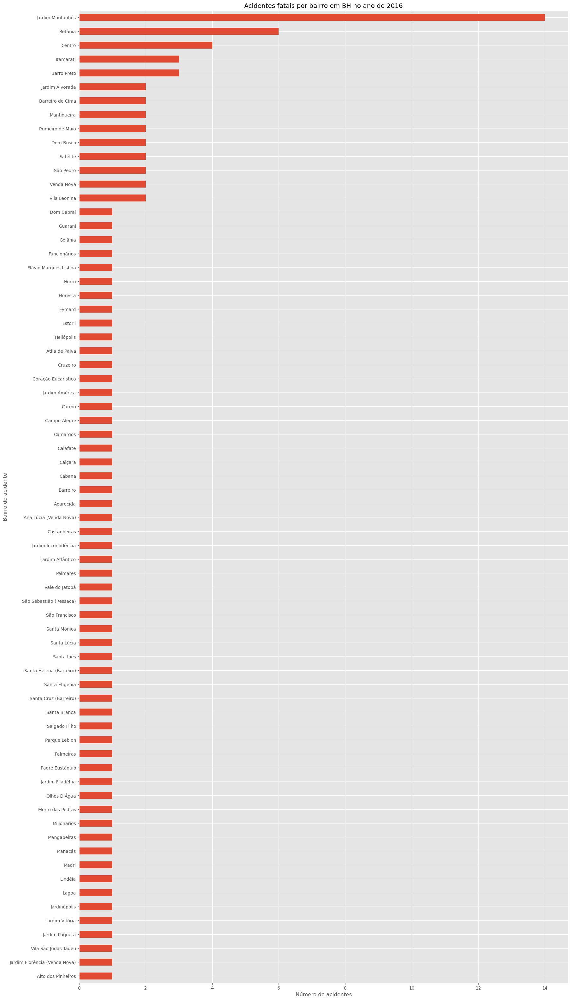

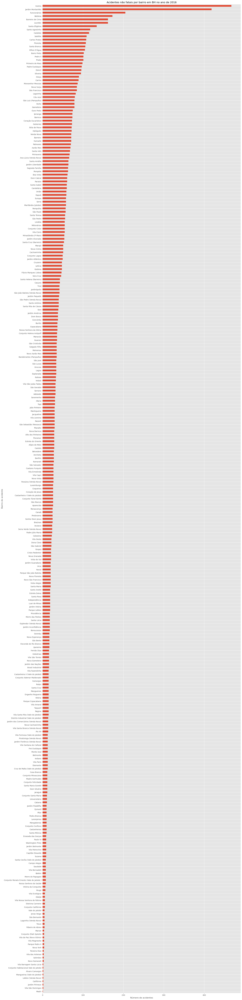

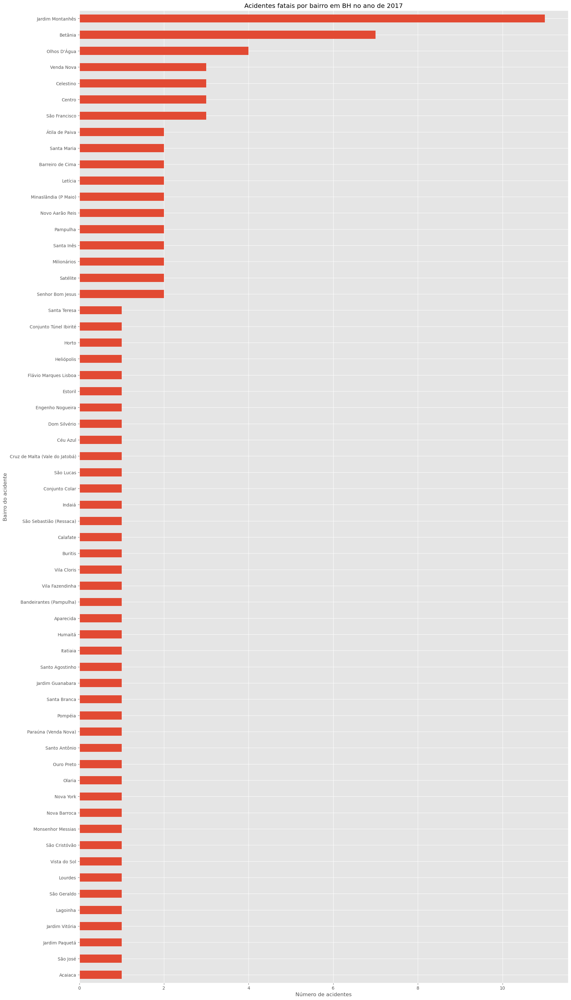

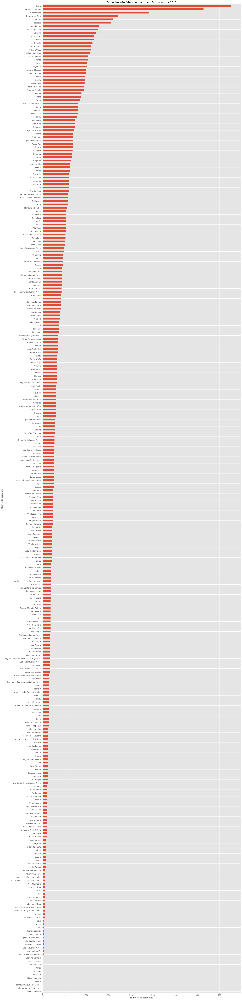

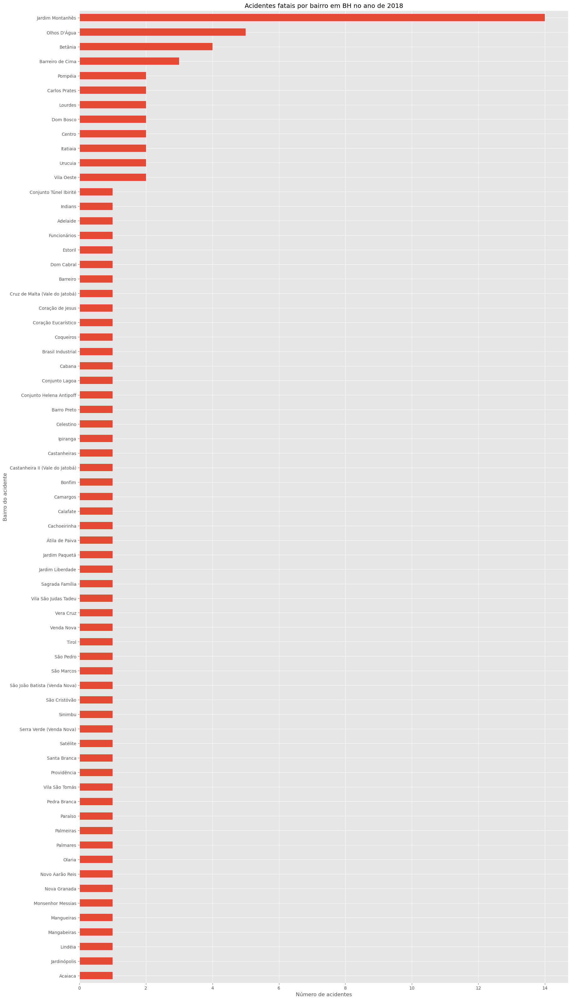

...

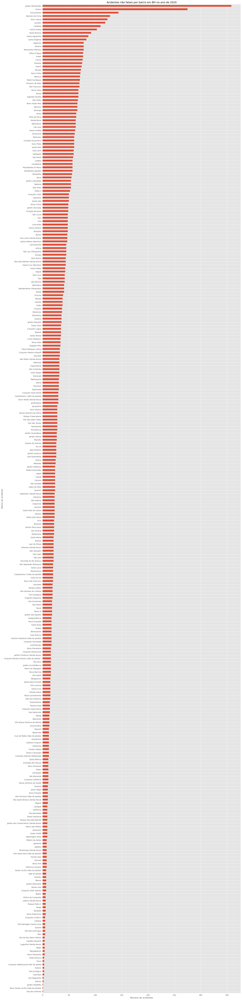

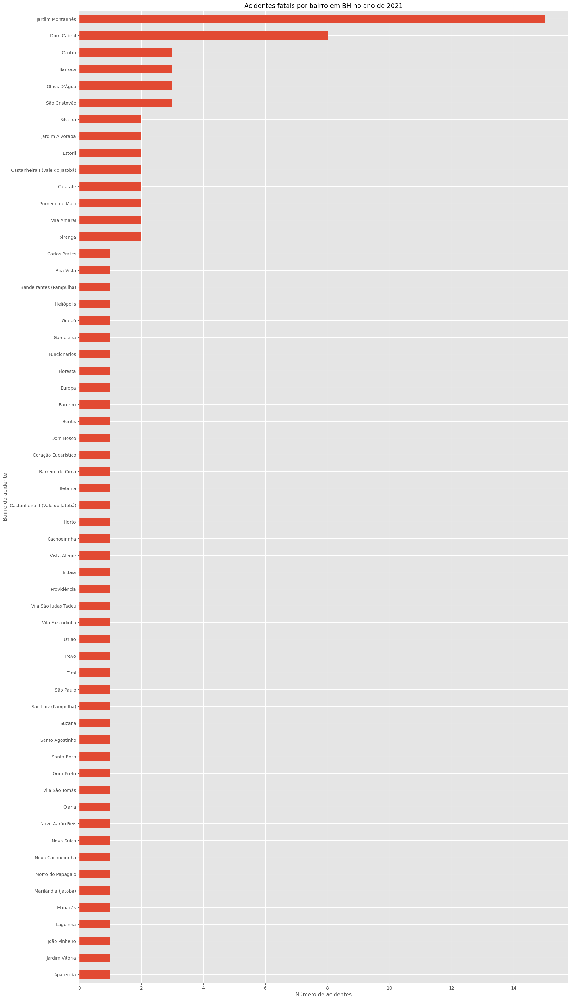

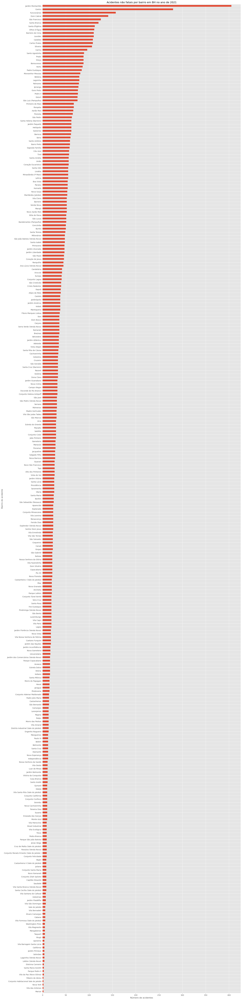

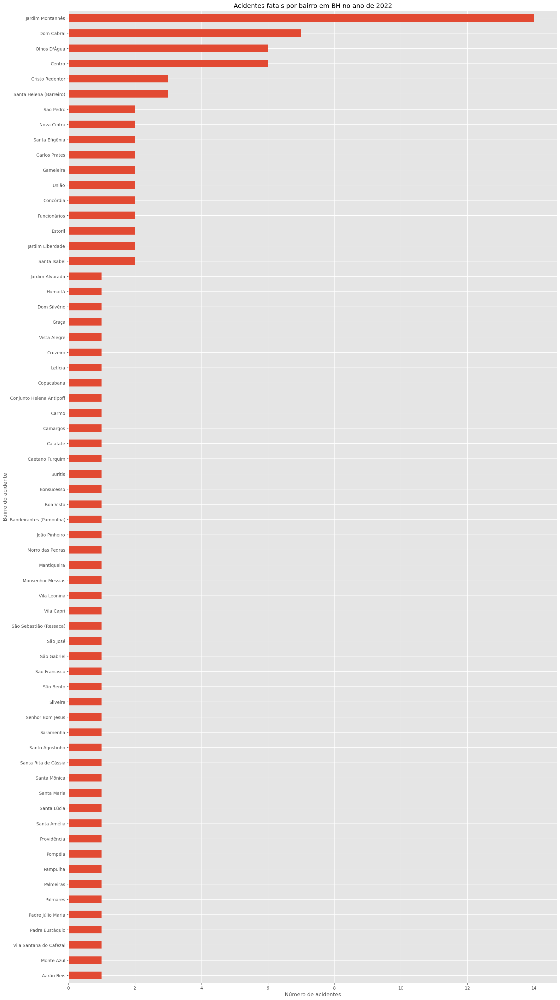

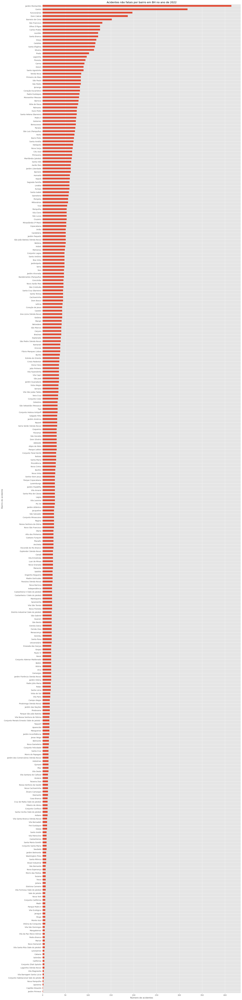

In [20]:
#loop para contar a quantidade de cada tipo de acidente fatais e não fatais por ano, deixar em ordem decrescente de quantidade de ocorrência e criar o gráfico de barras
for ano in range(2016, 2022+1):
    df_ano = df.loc[df.get('ano') == ano]
    #casos fatais
    df_acidentes_do_ano_fatais = df_ano.loc[df_ano.get('indicador_fatalidade') == "SIM"]
    df_acidentes_do_ano_fatais_por_bairro = df_acidentes_do_ano_fatais.groupby('bairro').size().sort_values()
    df_acidentes_do_ano_fatais_por_bairro.plot(kind = 'barh',
                                             xlabel = 'Número de acidentes',
                                             ylabel = 'Bairro do acidente',
                                             title = f"Acidentes fatais por bairro em BH no ano de {ano}",
                                             figsize = (20, 40))                                            
    plt.show()
    #casos não fatais
    df_acidentes_do_ano_nao_fatais = df_ano.loc[df_ano.get('indicador_fatalidade')== "NÃO"]
    df_acidentes_do_ano_nao_fatais_por_bairro = df_acidentes_do_ano_nao_fatais.groupby('bairro').size().sort_values()
    df_acidentes_do_ano_nao_fatais_por_bairro.plot(kind = 'barh', 
                                                 xlabel = 'Número de acidentes',
                                                 ylabel = 'Bairro do acidente',
                                                 title = f"Acidentes não fatais por bairro em BH no ano de {ano}",
                                                 figsize = (20, 100))
    plt.show()

### 6. Plotar Mapa de Belo Horizonte por Tipo de Acidente:

#### (i) Faça um gráfico de dispersão das latitudes e longitudes.  

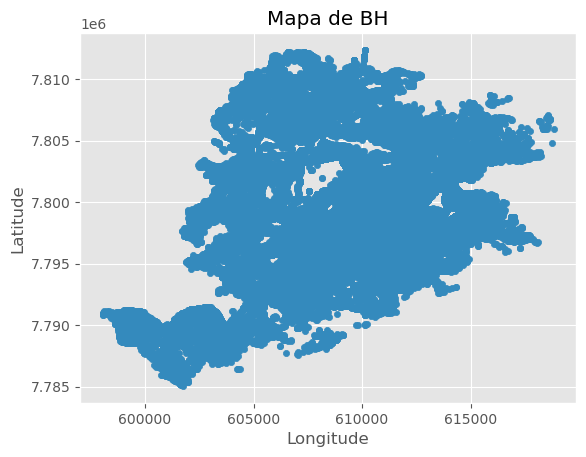

In [23]:
#gráfico de dispersão das latitudes e longitudes
df.plot(kind = 'scatter',
        x ='coordenada_x',
        xlabel = 'Longitude',
        y = 'coordenada_y',
        ylabel = 'Latitude',
        title = 'Mapa de BH')
plt.show()

#### (ii) Para entender bem os tipos de acidentes, faça gráficos por tipos diferentes de acidentes.

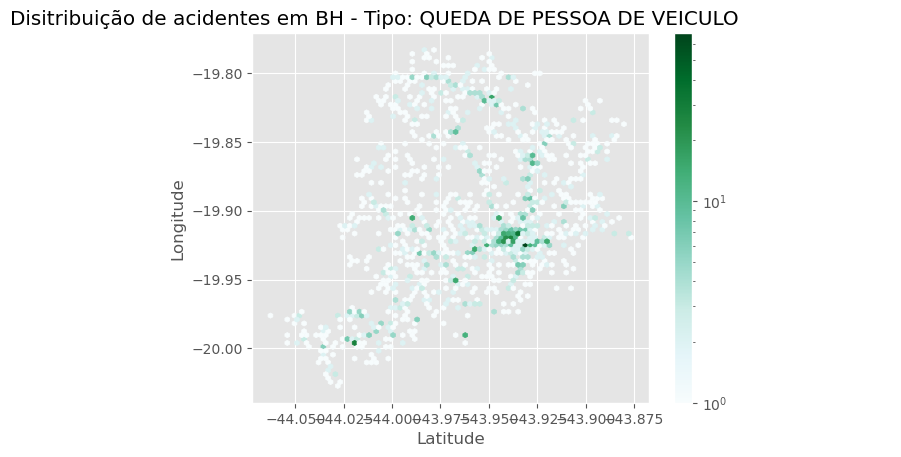

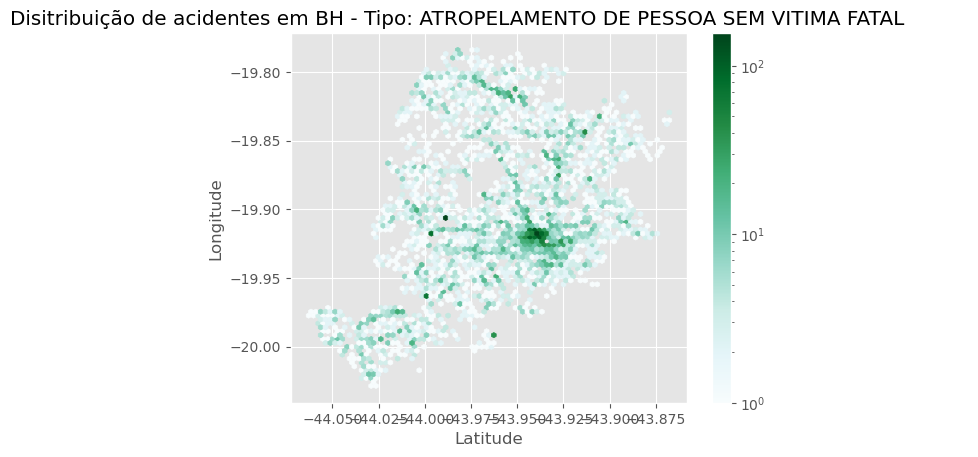

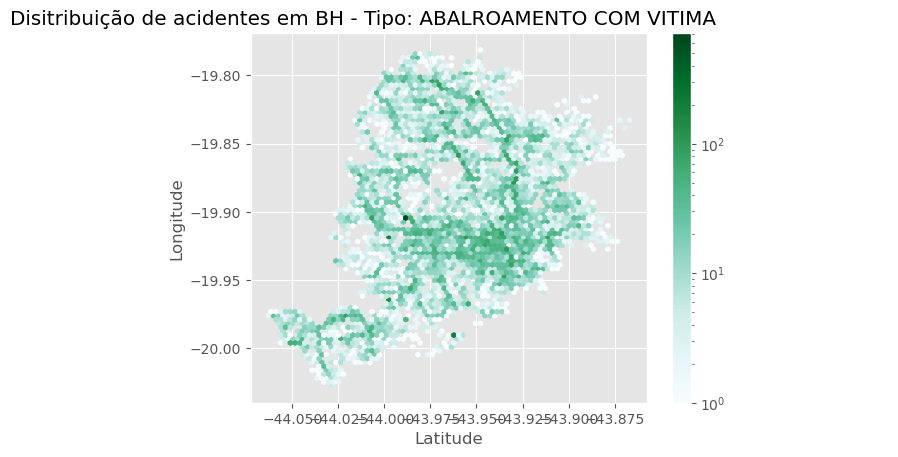

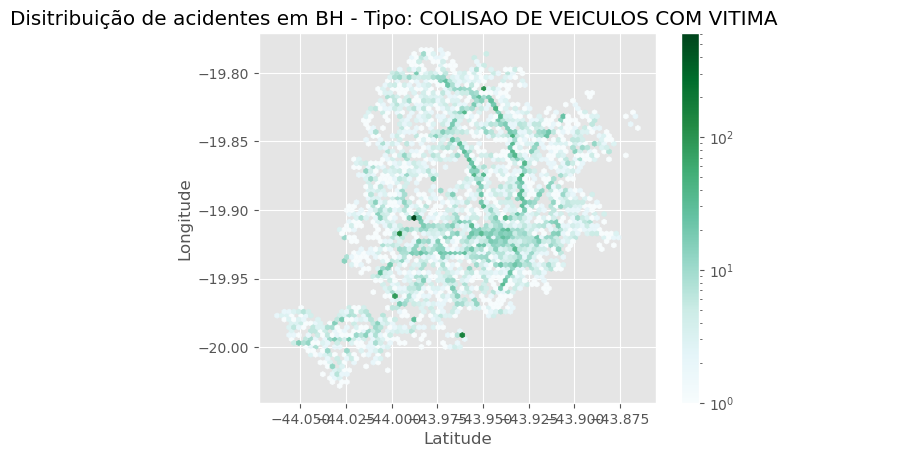

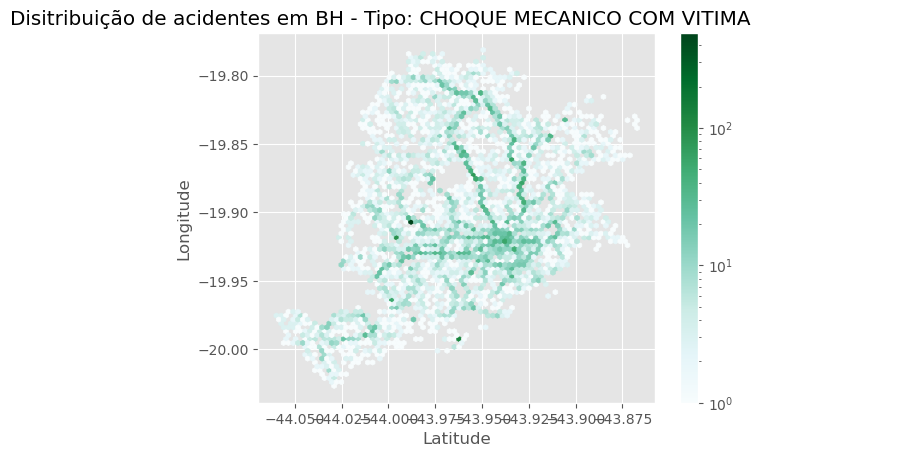

...

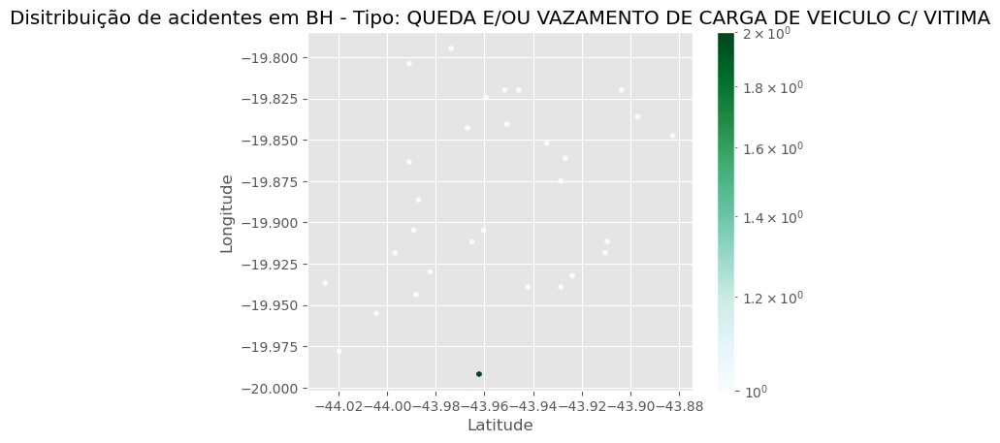

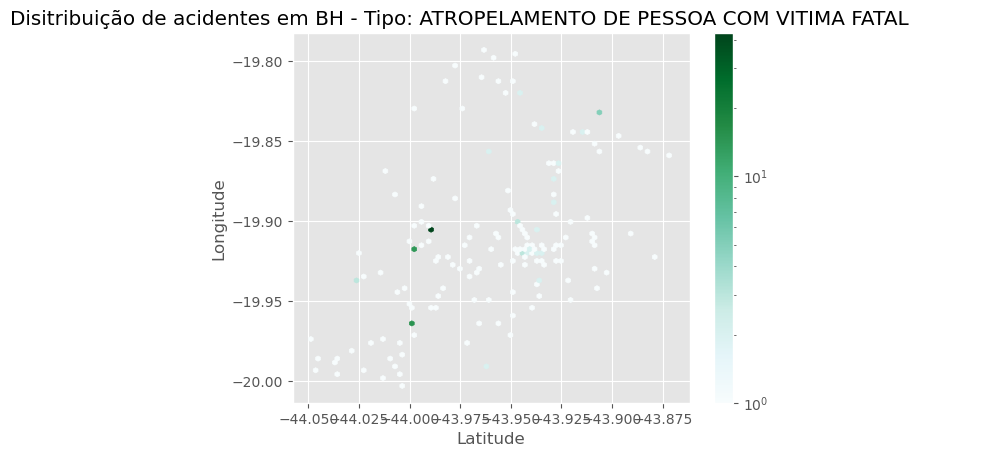

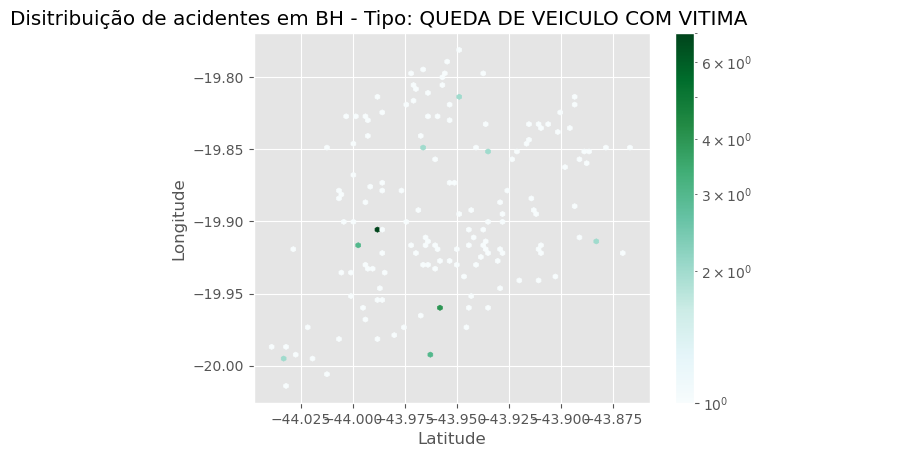

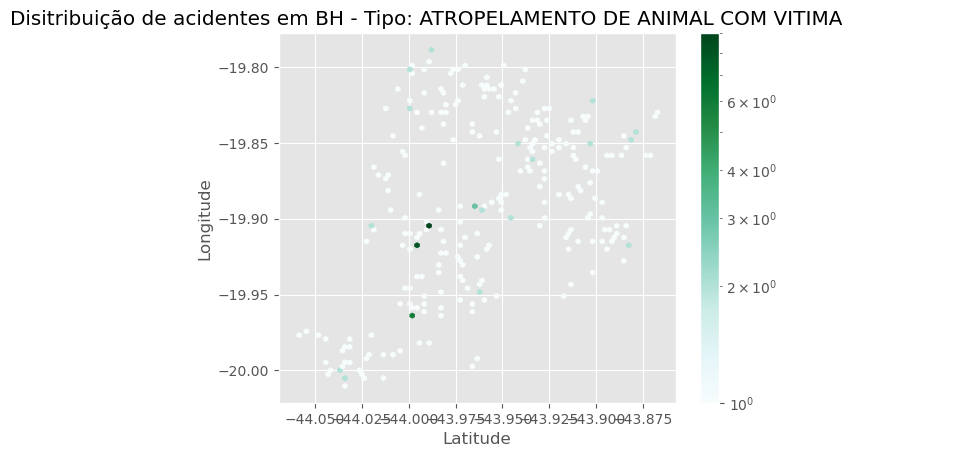

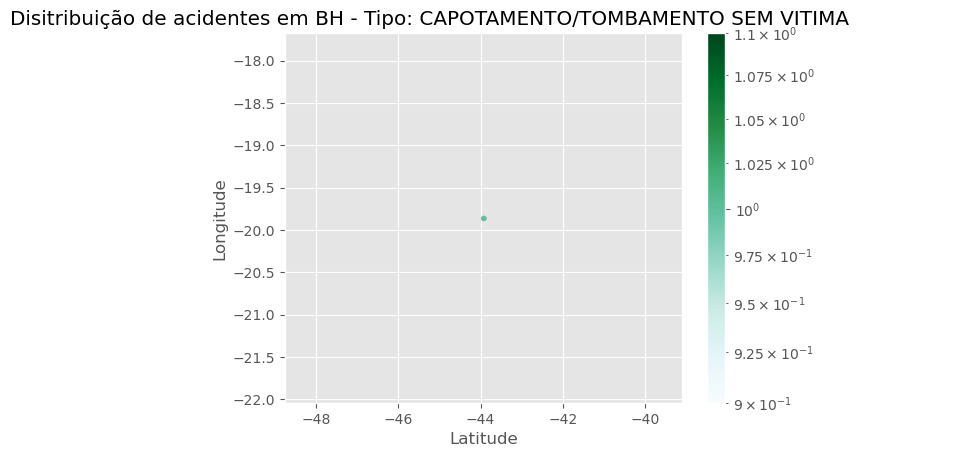

In [25]:
#criar array com todos os tipos de acidentes descritos
tipos_de_acidentes_descritos = df.get('desc_tipo_acidente').unique()
#cirar gráfico de dispersão por tipo
for tipo in tipos_de_acidentes_descritos:
    df_tipos = df[df.get('desc_tipo_acidente') == tipo]
    df_tipos.plot(
    kind='hexbin',
    x='lat',
    y='lon',
    mincnt=1,
    gridsize=75,
    bins='log',
    xlabel = 'Latitude',
    ylabel = 'Longitude',
    title = f'Disitribuição de acidentes em BH - Tipo: {tipo}'
    )

### 7. Plotar Intervalo de Confiança via Bootstrap do Número de Acidentes por Mês:


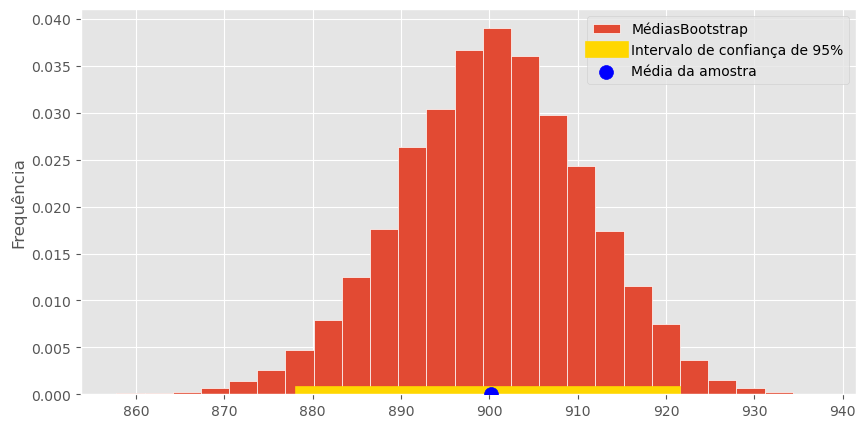

'Podemos dizer com 95% de confiança que a média mensal de acidentes em Belo Horizonte está entre 878.8330357142858 e 920.6315476190476'

In [27]:
np.random.seed(38) #para ter sempre o mesmo resultado ao executar o código
n_reamostragens = 10000 #10000 reamostragens
boot_media = np.array([])

for i in range(n_reamostragens):
    reamostragem = acidentes_por_ano_mes.sample(12*7, replace = True)
    media = reamostragem.mean()
    boot_media = np.append(boot_media, media)

media_populacional = acidentes_por_ano_mes.mean()

#percentis de um IC de 95%
esquerda = np.percentile(boot_media, 2.5)
direita = np.percentile(boot_media, 97.5)

bpd.DataFrame().assign(MédiasBootstrap=boot_media).plot(kind='hist', density=True, bins=25, ec='w', figsize=(10, 5), zorder=1)
plt.plot([esquerda, direita], [0, 0], color='gold', linewidth=12, label='Intervalo de confiança de 95%', zorder=2);
plt.scatter(media_populacional, 0.000004, color='blue', s=100, label='Média da amostra', zorder=3)
plt.legend()
plt.ylabel("Frequência");
plt.show()
f"Podemos dizer com 95% de confiança que a média mensal de acidentes em Belo Horizonte está entre {esquerda} e {direita}"

### 8. Vamos brincar de regressão. 
Inicialmente, faça um gráfico de dispersão onde o eixo X é o número de acidentes em 2019, 2020 ou 2021. Serão três gráficos. Cada ponto no gráfico vai corresponder a um bairro.

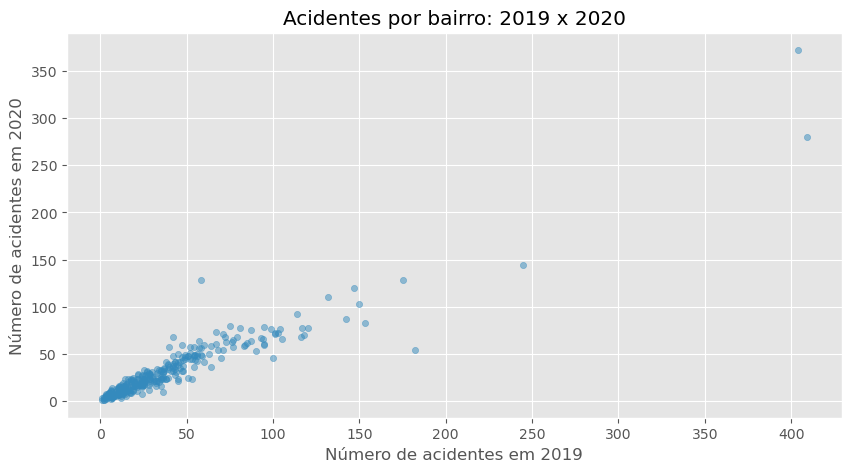

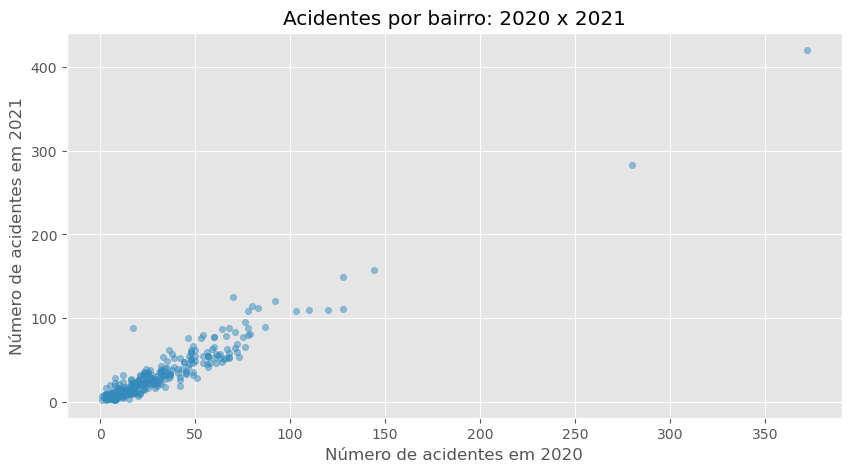

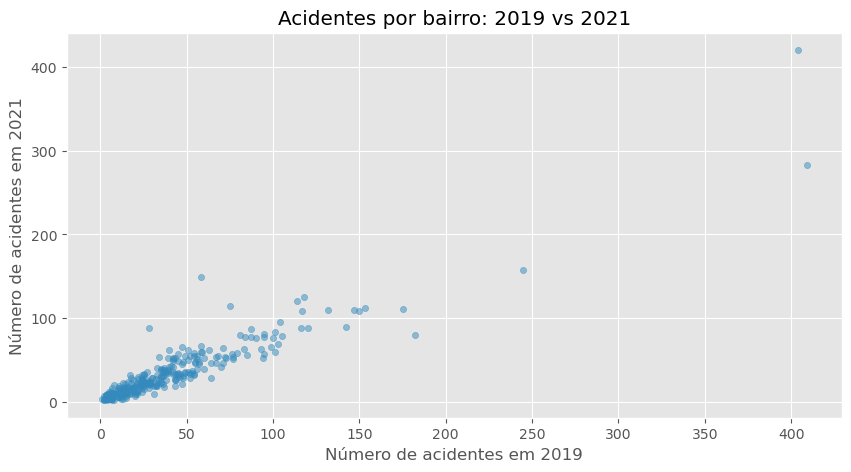

In [29]:
#Dica 1: Faça um df.groupby(['bairro', 'ano']).size()
cont = df.groupby(['bairro', 'ano']).size().reset_index()
dados_2019 = cont[cont.get('ano') == 2019]
dados_2020 = cont[cont.get('ano') == 2020]
dados_2021 = cont[cont.get('ano') == 2021]

#Dica 2: Faça um merge para juntar os dois anos
dados_2019_2020 = dados_2019.merge(dados_2020, on='bairro')
dados_2020_2021 = dados_2020.merge(dados_2021, on='bairro')
dados_2019_2021 = dados_2019.merge(dados_2021, on='bairro')

#criar gráfico de disperção dos três anos
dados_2019_2020.plot(figsize = (10,5), kind = "scatter", x='0_x', y='0_y', alpha = 0.5, xlabel = "Número de acidentes em 2019", ylabel = "Número de acidentes em 2020", title = 'Acidentes por bairro: 2019 x 2020', grid = True)
plt.show()
dados_2020_2021.plot(figsize = (10,5), kind = "scatter", x='0_x', y='0_y', alpha = 0.5, xlabel = "Número de acidentes em 2020", ylabel = "Número de acidentes em 2021", title = 'Acidentes por bairro: 2020 x 2021', grid = True)
plt.show()
dados_2019_2021.plot(figsize = (10,5), kind = "scatter", x='0_x', y='0_y', alpha = 0.5, xlabel = "Número de acidentes em 2019", ylabel = "Número de acidentes em 2021", title = 'Acidentes por bairro: 2019 vs 2021', grid = True)                   
plt.show()

### 9. Use o Número de Acidentes por bairro de 2019 para Prever 2022:


Axes(0.125,0.11;0.775x0.77)
Axes(0.125,0.11;0.775x0.77)
Axes(0.125,0.11;0.775x0.77)


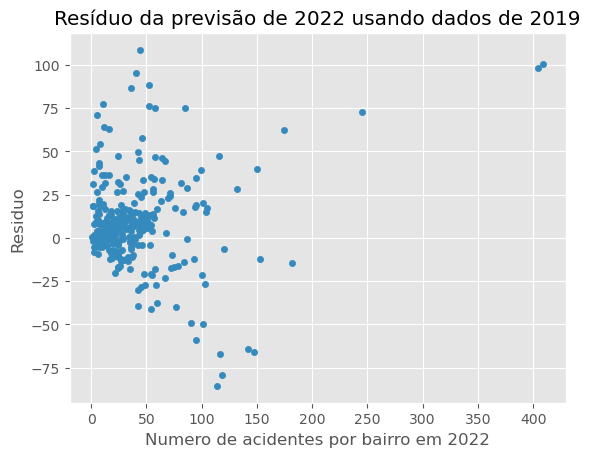

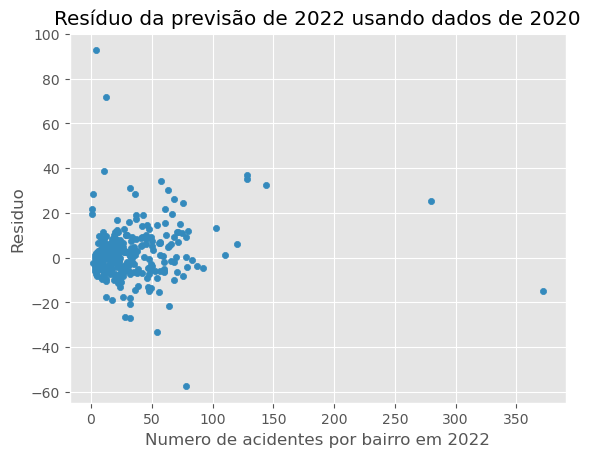

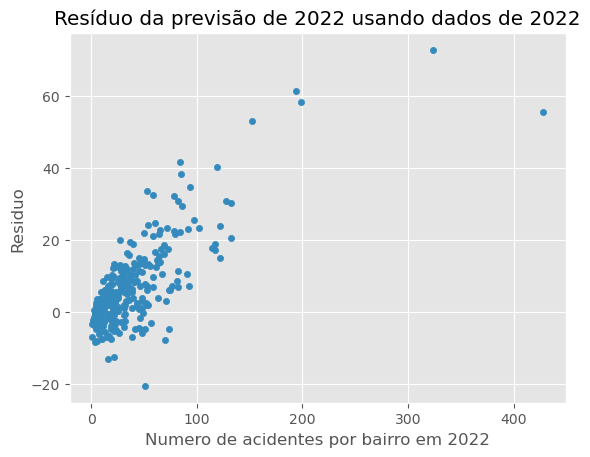

In [31]:
#funções retiradas do Tópico 25 – Regressão Linear

##unidades parão
def standard_units(col):
    return (col - col.mean()) / np.std(col)
##r
def calculate_r(df, x, y):
    '''Returns the average value of the product of x and y, 
       when both are measured in standard units.'''
    x_su = standard_units(df.get(x))
    y_su = standard_units(df.get(y))
    return (x_su * y_su).mean()
##inclinação
def slope(df, x, y):
    "Returns the slope of the regression line between columns x and y in df (in original units)."
    r = calculate_r(df, x, y)
    return r * np.std(df.get(y)) / np.std(df.get(x))
##intercepto
def intercept(df, x, y):
    "Returns the intercept of the regression line between columns x and y in df (in original units)."
    return df.get(y).mean() - slope(df, x, y) * df.get(x).mean()

#dados 2019-2021
inclinacao_2019_2021 = slope(dados_2019_2021,'0_x' ,'0_y')
coef_linear_2019_2021 = intercept(dados_2019_2021,'0_x' ,'0_y')
previsao_2022_com_2019 = inclinacao_2019_2021 * dados_2019_2021.get('0_y') + coef_linear_2019_2021

df_previsao_2022_com_2019 = dados_2019_2021.assign(Previsao2022 = previsao_2022_com_2019)

#dados 2020-2021
inclinacao_2020_2021 = slope(dados_2020_2021,'0_x' ,'0_y')
coef_linear_2020_2021 = intercept(dados_2020_2021,'0_x' ,'0_y')
previsao_2022_com_2020 = inclinacao_2020_2021 * dados_2020_2021.get('0_y') + coef_linear_2020_2021

df_previsao_2022_com_2020 = dados_2020_2021.assign(Previsao2022 = previsao_2022_com_2020)

#dados 2022_2021
dados_2022 = cont[cont.get('ano') == 2022]
dados_2022_2021 = dados_2022.merge(dados_2021, on='bairro')

inclinacao_2022_2021 = slope(dados_2022_2021,'0_x' ,'0_y')
coef_linear_2022_2021 = intercept(dados_2022_2021,'0_x' ,'0_y')
previsao_2022_com_2022 = inclinacao_2022_2021 * dados_2022_2021.get('0_y') + coef_linear_2022_2021

df_previsao_2022_com_2022 = dados_2022_2021.assign(Previsao2022 = previsao_2022_com_2022)

#Resíduos
residuos_da_previsao_2022_com_2019 = df_previsao_2022_com_2019.assign(
    residuo = df_previsao_2022_com_2022.get('0_x') - df_previsao_2022_com_2019.get('Previsao2022')
)
residuos_da_previsao_2022_com_2020 = df_previsao_2022_com_2020.assign(
    residuo = df_previsao_2022_com_2022.get('0_x') - df_previsao_2022_com_2020.get('Previsao2022')
)
residuos_da_previsao_2022_com_2022 = df_previsao_2022_com_2022.assign(
    residuo = df_previsao_2022_com_2022.get('0_x') - df_previsao_2022_com_2022.get('Previsao2022')
)
print(residuos_da_previsao_2022_com_2019.plot(kind='scatter', x='0_x', y='residuo', ylabel='Residuo', xlabel='Numero de acidentes por bairro em 2022', title='Resíduo da previsão de 2022 usando dados de 2019'))
print(residuos_da_previsao_2022_com_2020.plot(kind='scatter', x='0_x', y='residuo', ylabel='Residuo', xlabel='Numero de acidentes por bairro em 2022', title='Resíduo da previsão de 2022 usando dados de 2020'))
print(residuos_da_previsao_2022_com_2022.plot(kind='scatter', x='0_x', y='residuo', ylabel='Residuo', xlabel='Numero de acidentes por bairro em 2022', title='Resíduo da previsão de 2022 usando dados de 2022'))

Visualmente, a previsão de 2022, feita com base nos dados de 2020, foi a mais precisa, pois apresentou menos pontos distantes ou extremamente distantes de 0. No entanto, os modelos são limitados por não considerarem eventos que não puderam ser ou não foram registrados na base de dados, como a pandemia recente, eventos climáticos extremos, mudanças na infraestrutura ou nas leis de trânsito, entre outros. Além disso, devido à variedade dos dados, uma regressão linear simples pode não ser precisa o suficiente para todas as situações.


### 10. Fazer Análises Adicionais de Interesse:


#### 10.1. Fazer a análise do problema 6 por região
Ao fazer pela descrição regional perde-se um pouco da precisão local, entretanto o ganho por um gráfico de barras mais limpo é superior à perda.

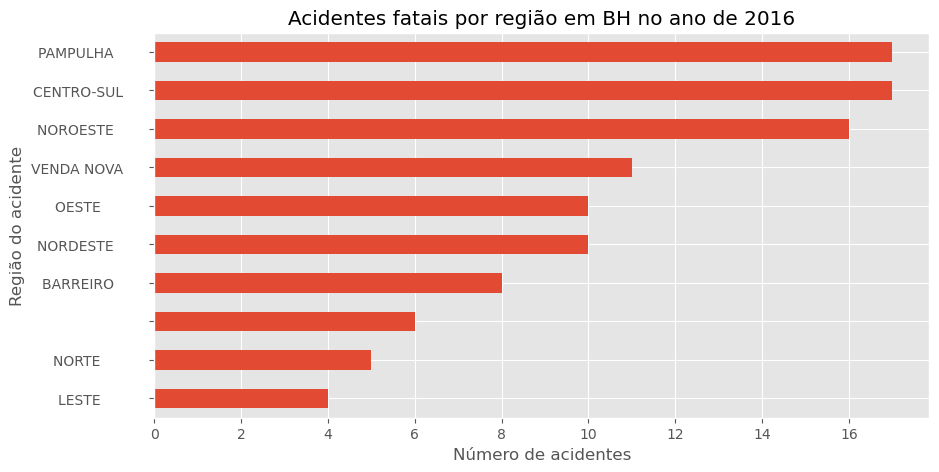

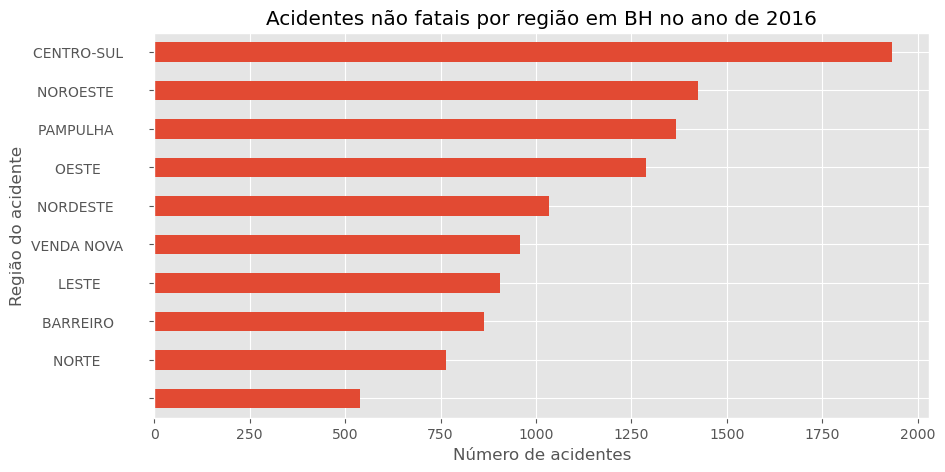

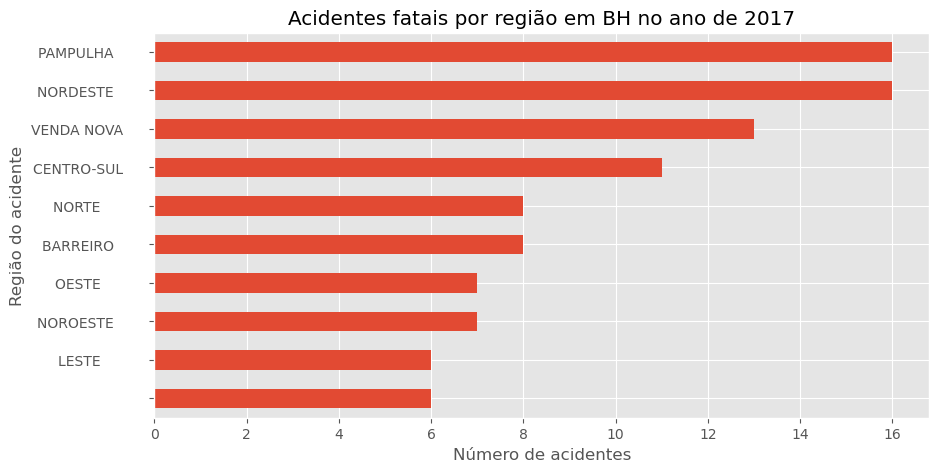

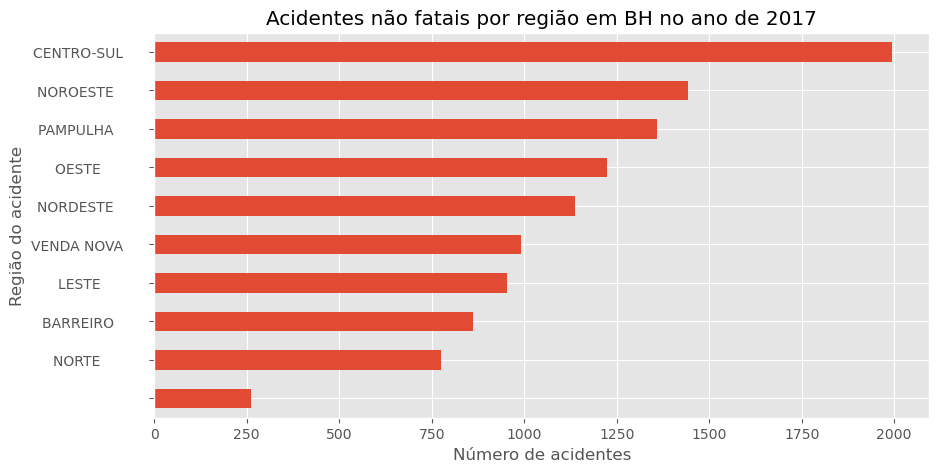

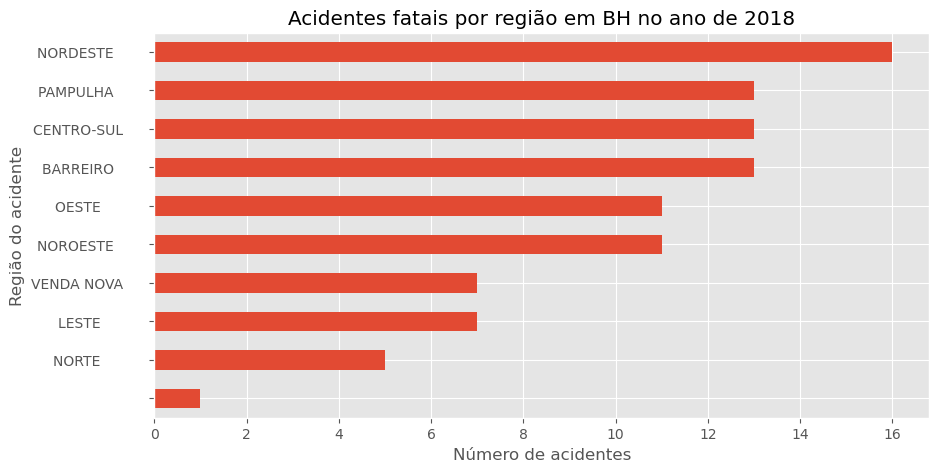

...

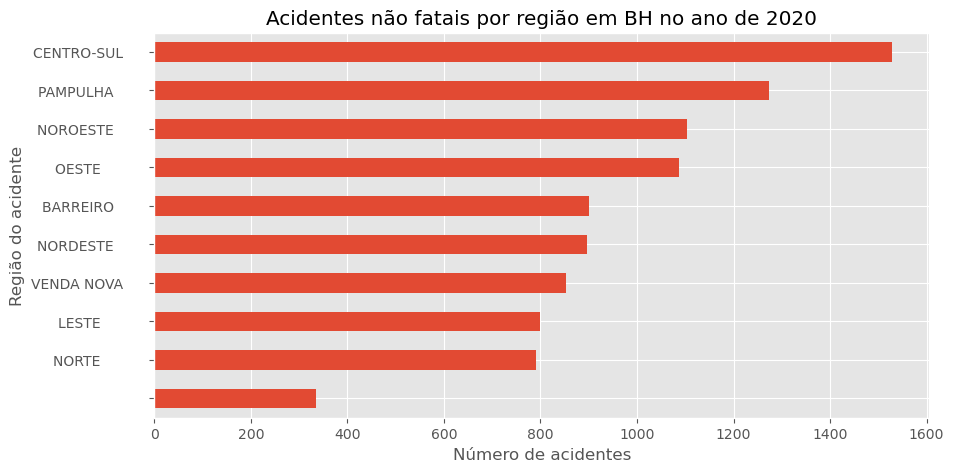

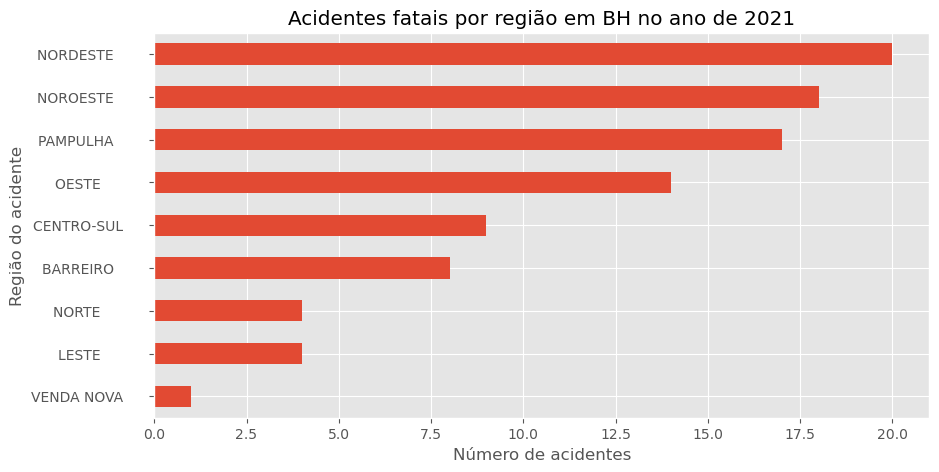

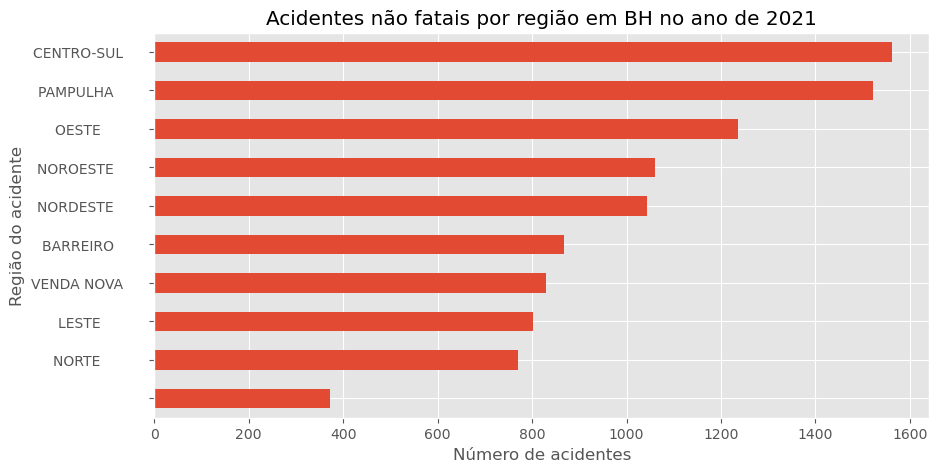

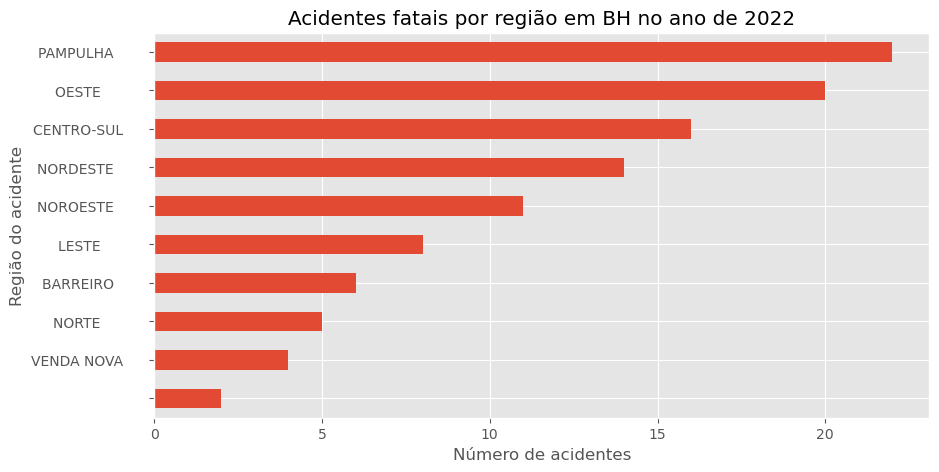

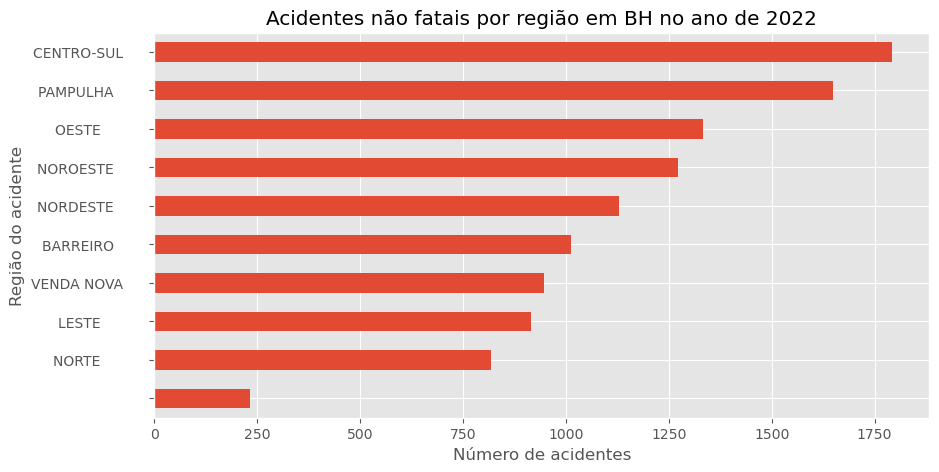

In [35]:
for ano in range(2016, 2022+1):
    df_ano = df.loc[df.get('ano') == ano]
    #casos fatais
    df_acidentes_do_ano_fatais = df_ano.loc[df_ano.get('indicador_fatalidade') == "SIM"]
    df_acidentes_do_ano_fatais_por_regiao = df_acidentes_do_ano_fatais.groupby('desc_regional').size().sort_values()
    df_acidentes_do_ano_fatais_por_regiao.plot(kind = 'barh',
                                             xlabel = 'Número de acidentes',
                                             ylabel = 'Região do acidente',
                                             title = f"Acidentes fatais por região em BH no ano de {ano}",
                                             figsize = (10, 5))                                            
    plt.show()
    #casos não fatais
    df_acidentes_do_ano_nao_fatais = df_ano.loc[df_ano.get('indicador_fatalidade')== "NÃO"]
    df_acidentes_do_ano_nao_fatais_por_regiao = df_acidentes_do_ano_nao_fatais.groupby('desc_regional').size().sort_values()
    df_acidentes_do_ano_nao_fatais_por_regiao.plot(kind = 'barh', 
                                                 xlabel = 'Número de acidentes',
                                                 ylabel = 'Região do acidente',
                                                 title = f"Acidentes não fatais por região em BH no ano de {ano}",
                                                 figsize = (10, 5))
    plt.show()

#### 10.2. Fazer análise do limite de velociade da via com acidentes fatais

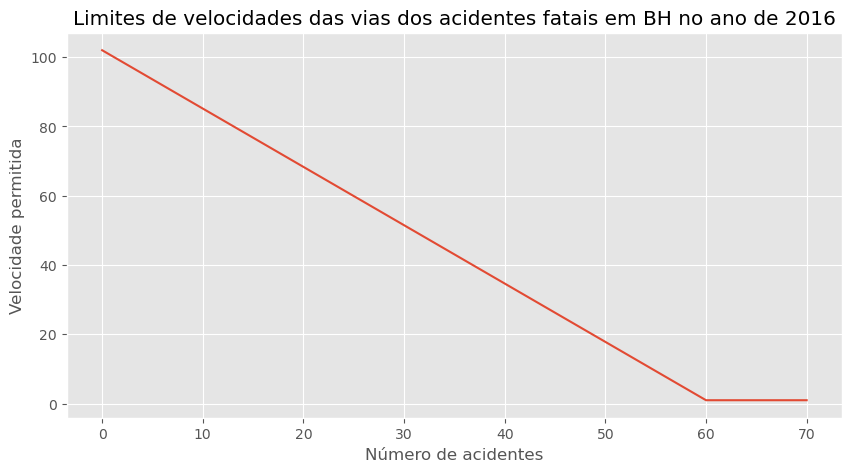

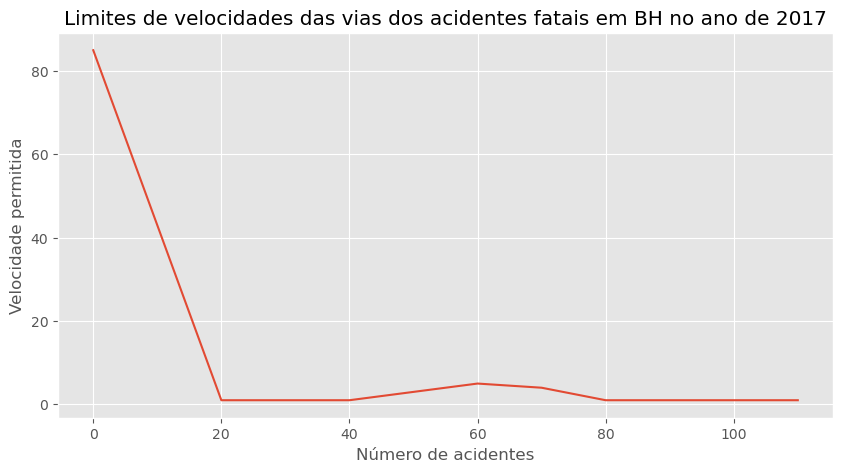

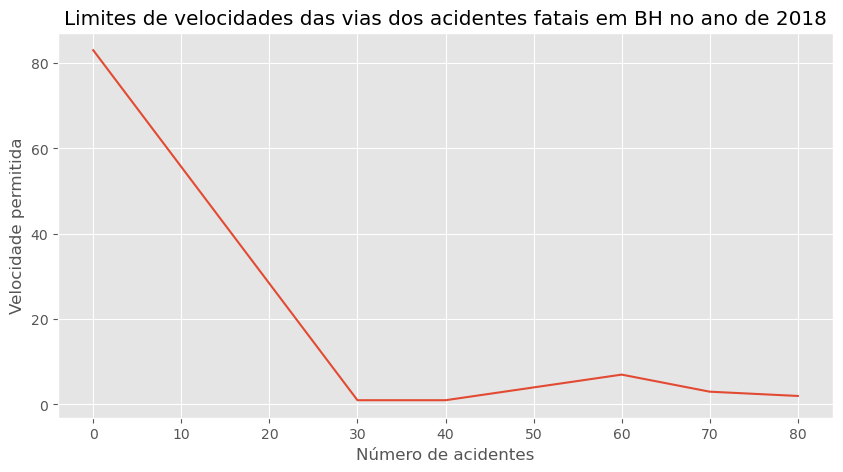

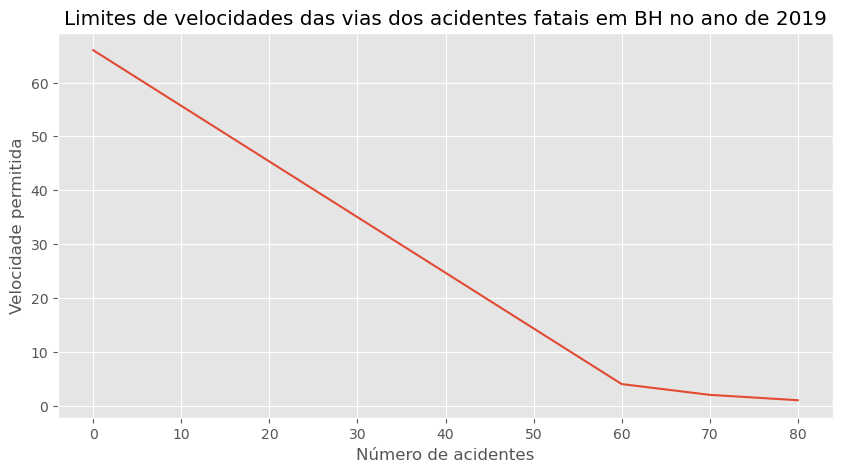

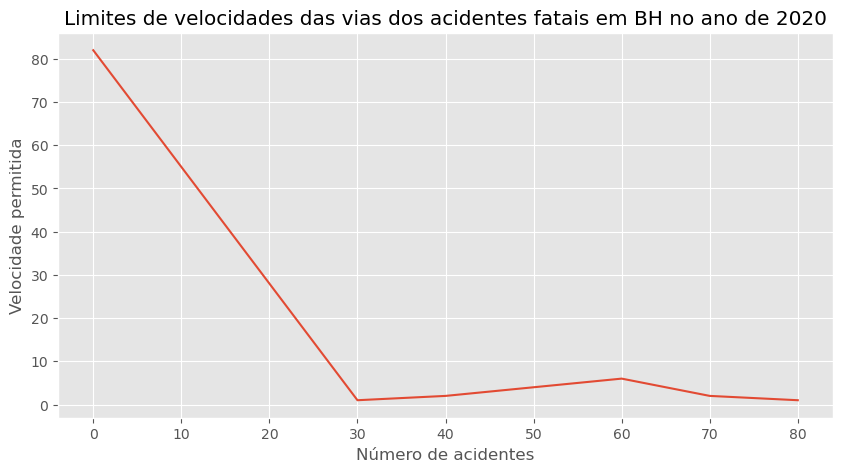

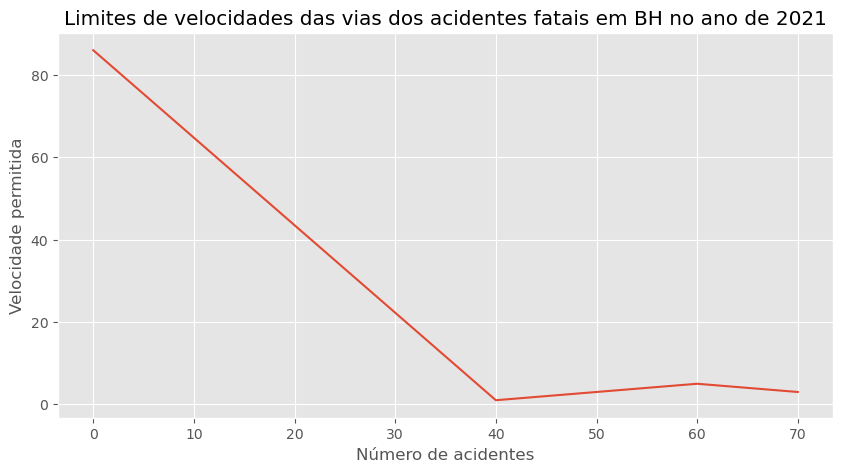

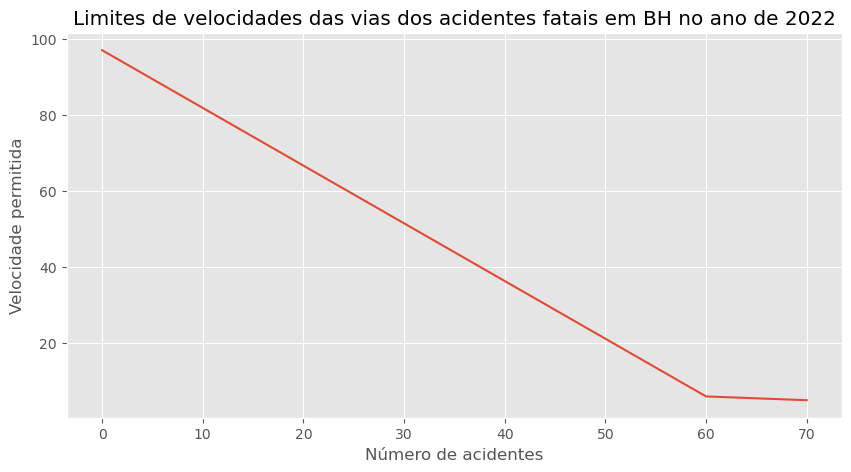

In [37]:
for ano in range(2016, 2022+1):
    df_ano = df.loc[df.get('ano') == ano]
    #casos fatais
    df_acidentes_do_ano_fatais = df_ano.loc[df_ano.get('indicador_fatalidade') == "SIM"]
    df_acidentes_do_ano_fatais_por_velocidade = df_acidentes_do_ano_fatais.groupby('velocidade_permitida').size()
    df_acidentes_do_ano_fatais_por_velocidade.plot(kind = 'line',
                                             xlabel = 'Número de acidentes',
                                             ylabel = 'Velocidade permitida',
                                             title = f"Limites de velocidades das vias dos acidentes fatais em BH no ano de {ano}",
                                             figsize = (10, 5))                                        
    plt.show()

In [38]:
df.get('velocidade_permitida').sort_values()

data_boletim
2016-01-01 00:30:00      0
2020-08-02 18:56:00      0
2020-08-02 18:18:00      0
2020-08-02 17:52:00      0
2020-08-02 17:33:00      0
                      ... 
2018-10-18 17:39:00    110
2019-12-05 20:31:00    110
2017-05-17 20:08:00    110
2018-11-10 20:25:00    110
2022-05-30 08:28:00    700
Name: velocidade_permitida, Length: 75619, dtype: int64

A análise foi realizada com os dados atuais, no entanto, fica evidente a necessidade de um tratamento nos dados, pois velocidades como 0 e 700 não são previstas pelo código de trânsito.

#### 10.3 Outras ideias
Algumas ideias interessantes na temática de Análise dos Acidentes de Trânsito de Belo Horizonte, dado esta base de dados seriam:
- Relação entre clima e quantidade e/ou fatalidade dos acidentes;
- Relação do pavimento e da sinalização com a quantidade e/ou fatalidade dos acidentes;
- Horários mais proprícios a acidentes, entre outras;